In this notebook, I am going to perform SARIMA. I am going to start on  first by doing decomposition, ACF and PCF, check for any seasonal variability and then poceed to dong the SARIMA

In [1]:
#basics
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# stats models
#from statsmodels.tsa.seasonal import seasonal_decompose
#from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
#from statsmodels.graphics.tsaplots import month_plot,quarter_plot

In [2]:
import sys
sys.path.append("src")   # VERY IMPORTANT

In [3]:
# load the data
df_1 = pd.read_csv('processed_inputs/df1_cleaned.csv',index_col='DATEPRD', parse_dates=True)
df_2 = pd.read_csv('processed_inputs/df2_cleaned.csv',index_col='DATEPRD', parse_dates=True)
df_3 = pd.read_csv('processed_inputs/df3_cleaned.csv',index_col='DATEPRD', parse_dates=True)
df_4 = pd.read_csv('processed_inputs/df4_cleaned.csv',index_col='DATEPRD', parse_dates=True)
df_5 = pd.read_csv('processed_inputs/df5_cleaned.csv',index_col='DATEPRD', parse_dates=True)


In [4]:
#explicitly sets the time frequency of  DatetimeIndex to "Daily" (D).
df_1.asfreq('D')
df_2.asfreq('D')
df_3.asfreq('D')
df_4.asfreq('D')
df_5.asfreq('D')
#df_6.asfreq('D')
#df_7.asfreq('D')

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF/STB,WCUT,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-01-12,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,1.181753,%,...,292.193845,293.154287,47.112332,0.0000,0.000000,0.0,0.837988,0.000000,1.0,1.0
2014-01-13,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,1.197065,%,...,336.328908,337.363609,43.389752,0.0000,0.000000,0.0,0.837988,0.000000,1.0,1.0
2014-01-14,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,1.125136,%,...,308.563704,309.614649,44.293874,0.0000,0.000000,0.0,0.837988,0.000000,1.0,1.0
2014-01-15,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,2.610212,%,...,392.971034,462.315732,45.836258,0.0000,0.000000,0.0,0.837988,0.000000,1.0,1.0
2014-01-16,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,24.0,8.660590,%,...,405.617020,810.338131,62.420158,2208.0378,1850.310175,0.0,0.837988,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,0.999251,%,...,202.677262,0.000000,32.000000,0.0000,0.000000,0.0,0.926279,0.594275,1.0,1.0
2016-09-14,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,1.049490,%,...,203.969260,0.000000,32.000000,0.0000,0.000000,0.0,0.926279,0.594275,1.0,1.0
2016-09-15,NO 15/9-F-15 D,7289.0,15/9-F-15 D,3420717.0,VOLVE,369304.0,MÆRSK INSPIRER,0.0,0.974846,%,...,205.583388,0.000000,32.000000,0.0000,0.000000,0.0,0.926279,0.594275,1.0,1.0


In [5]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHP_P_PSI',
       'BORE_WI_VOL_STB_D', 'AVG_WHT_P','GOR_MSCF/STB', 'WCUT']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

In [6]:
# Set Sarima order search space so you don't have to change it everytime


In [7]:
# helper function imports
from basic_helper_functions import seperate_target_plot
from basic_helper_functions import seperate_predictor_plot
from sarima_helper_functions import plot_decomposition
from sarima_helper_functions import plot_acf_pacf_channels
from sarima_helper_functions import plot_monthly_seasonality 
from sarima_helper_functions import sarima_split_train_test_keep


from sarima_helper_functions_EXO import find_best_sarima_model_for_all_phases_optuna_EXO
from sarima_helper_functions_EXO import plot_train_val_predictions_time_EXO
from sarima_helper_functions_EXO import plot_train_val_actual_vs_predicted_crossplot_EXO

In [8]:
sarima_exo_models_dict = {}
sarima_exo_order_dict={}

# DF1

In [9]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P','GOR_MSCF/STB', 'WCUT']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

In [10]:
df_1.head()

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF/STB,WCUT,AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING,AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING,AVG_DP_TUBING_PSI_WAS_MISSING,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-04-07,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.000000,%,...,0.0,0.0,0.0,0.804121,0.0,0,0,0,1,1
2014-04-08,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.003059,%,...,0.0,0.0,0.0,0.804121,0.0,1,1,1,1,1
2014-04-09,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.979008,%,...,0.0,0.0,0.0,0.804121,0.0,1,1,1,1,1
2014-04-10,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.545759,%,...,0.0,0.0,0.0,0.804121,0.0,1,1,1,1,1
2014-04-11,NO 15/9-F-1 C,7405,15/9-F-1 C,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.215987,%,...,0.0,0.0,0.0,0.804121,0.0,0,0,0,1,1


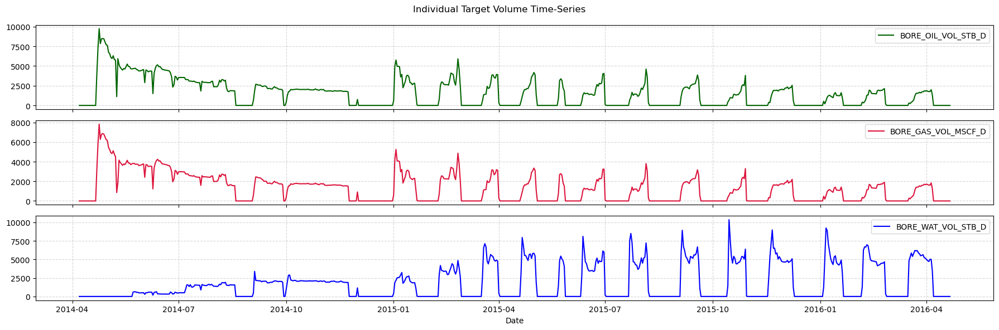

In [11]:
from basic_helper_functions import seperate_target_plot

seperate_target_plot(df_1[target_col])

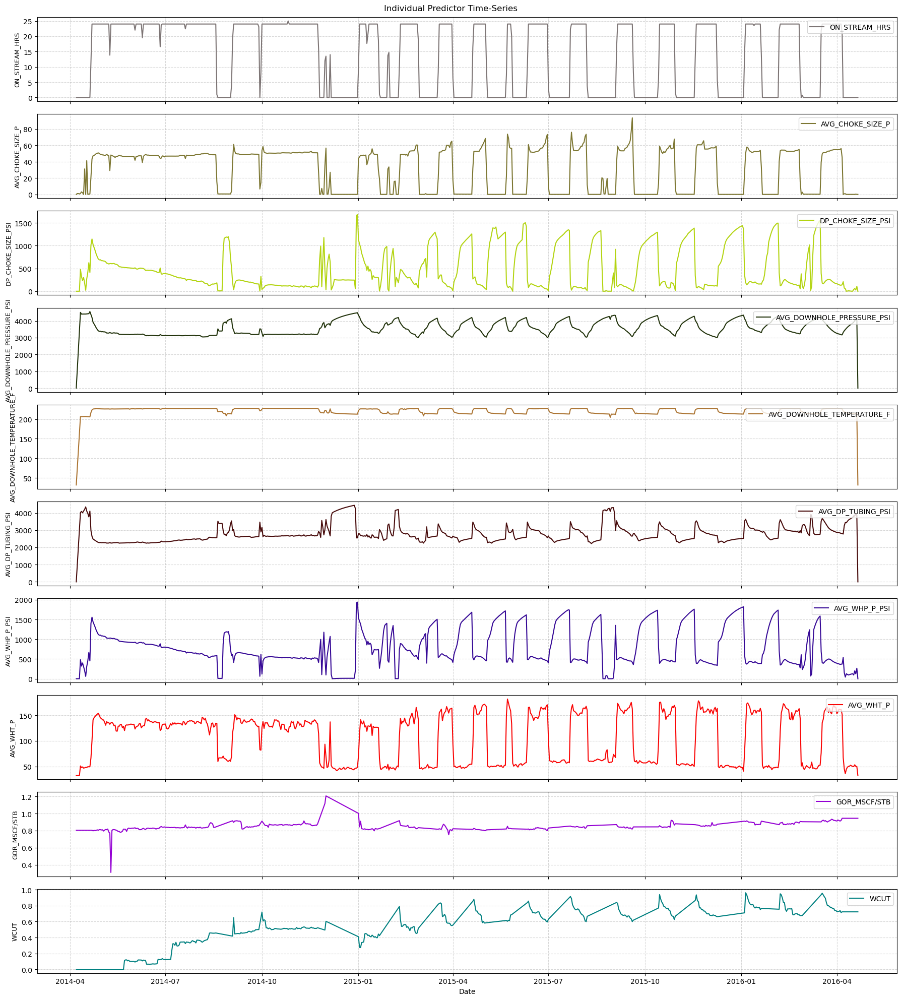

In [12]:
from basic_helper_functions import seperate_predictor_plot
seperate_predictor_plot(df_1, features=predictor_num_col)

## ETS Decomposition

Incorrect Period: If you choose a period that doesn't actually exist in the data, the algorithm still extracts a fake wave, but the Residual panel will still contain massive, highly structured spikes or waves. This means the model failed to capture the real underlying pattern.

Correct Period: When you hit the true operational frequency, the Residual panel will flatten out into random, unstructured noise (white noise). The spikes will disappear because the seasonal component successfully absorbed them.

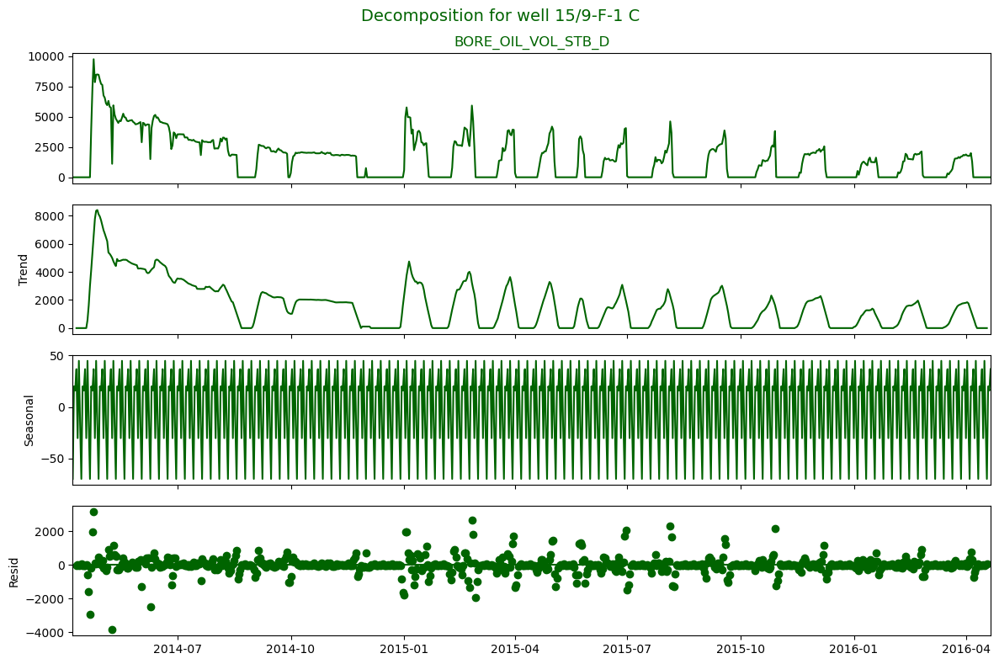

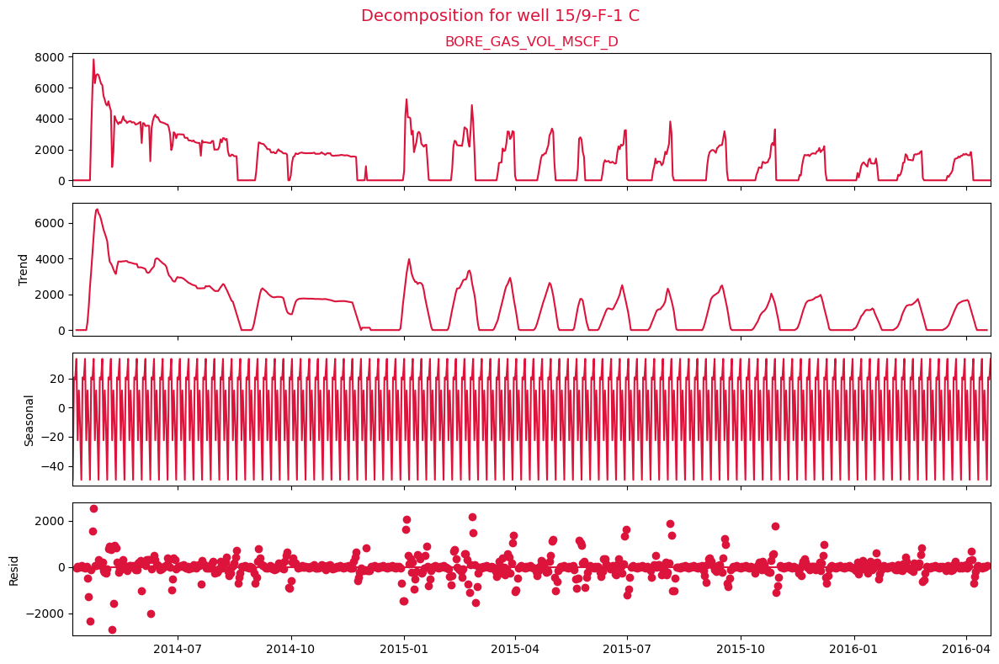

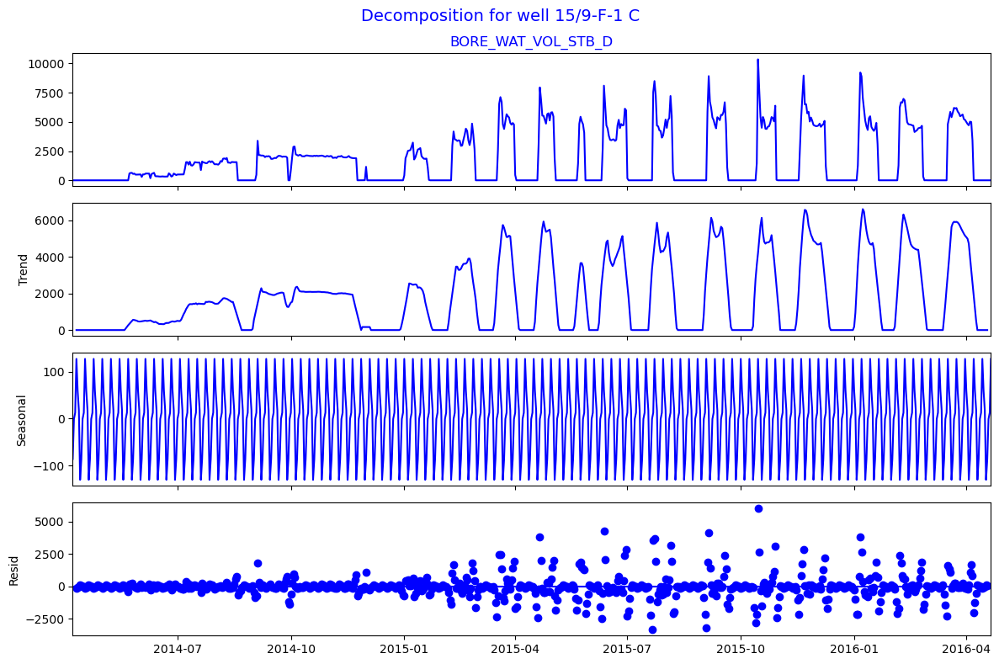

<Figure size 640x480 with 0 Axes>

In [13]:
from sarima_helper_functions import plot_decomposition 
plot_decomposition(df_1, target_col,model="additive", period=7)
plt.savefig('ets.png', dpi=300, bbox_inches='tight')

## ACF & PACF Plots and Monthly Plots

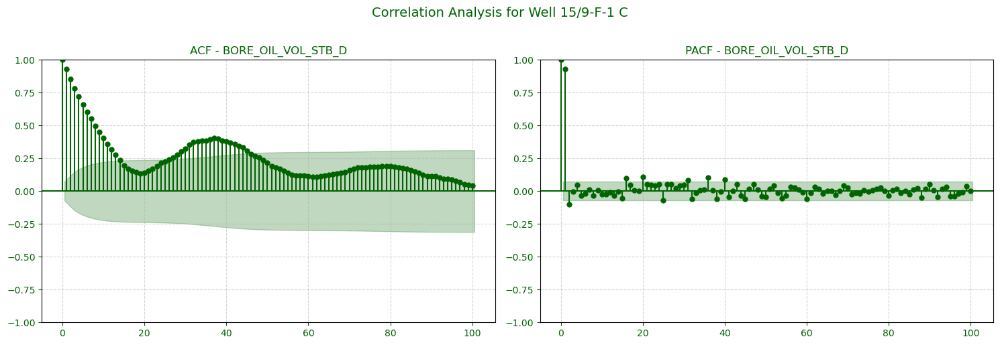

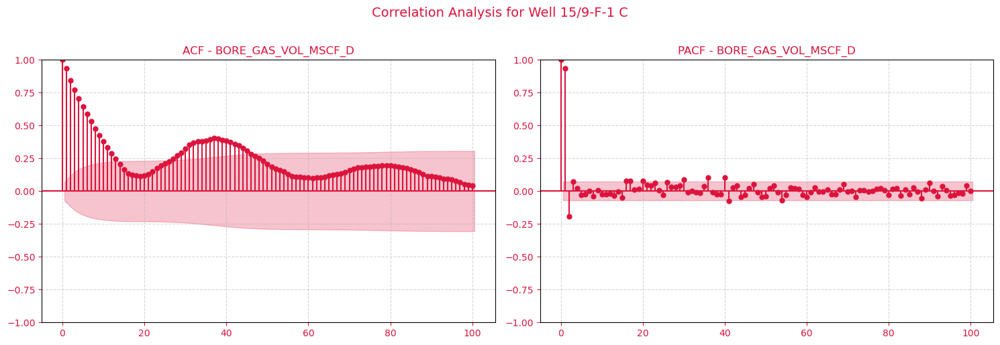

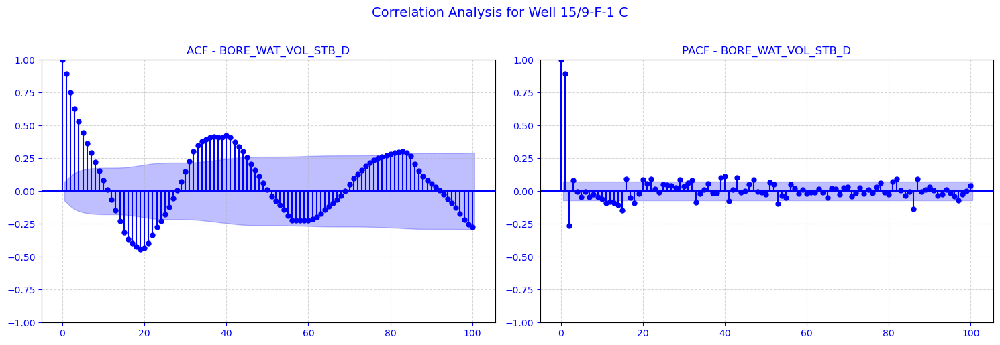

In [14]:
from sarima_helper_functions import plot_acf_pacf_channels
plot_acf_pacf_channels(df_1, target_col, lags=100)

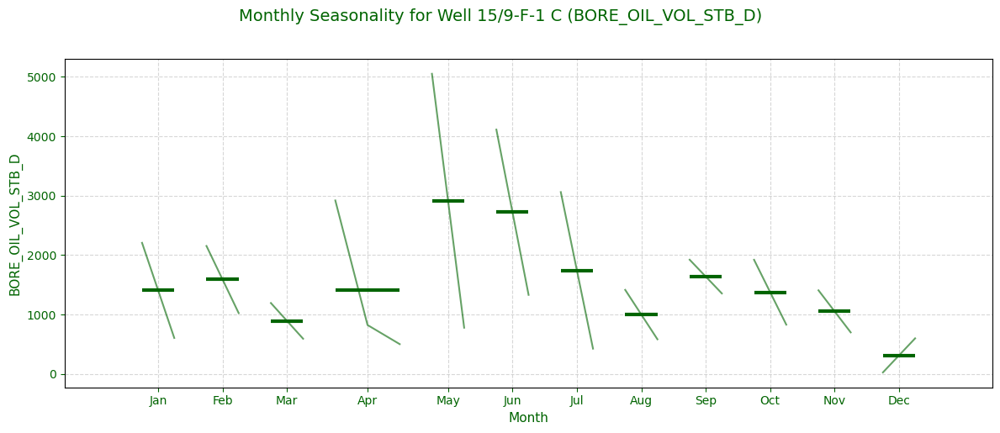

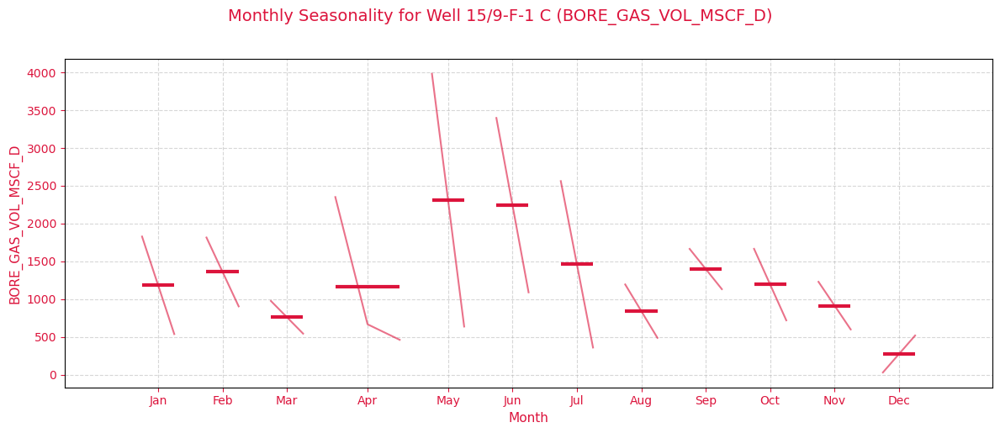

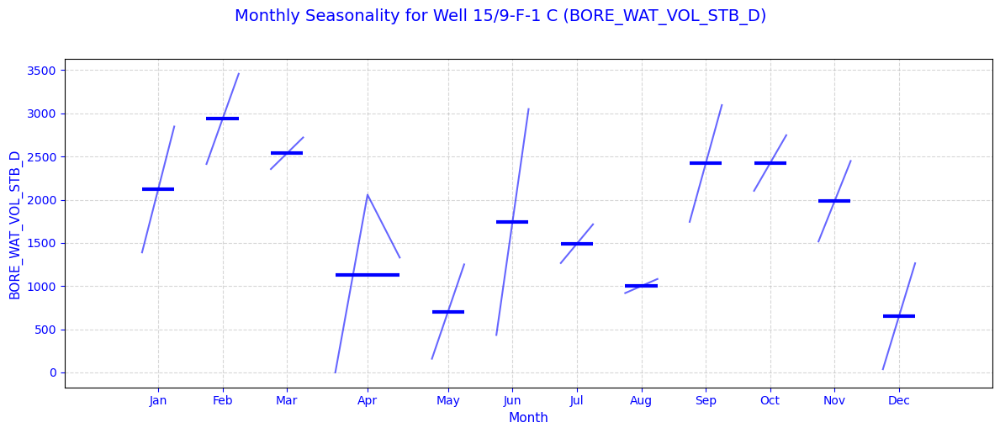

In [15]:
from sarima_helper_functions import plot_monthly_seasonality 

plot_monthly_seasonality(df_1, target_col)

## Find the best SARIMA model


In [16]:
from sarima_helper_functions import sarima_split_train_test_keep

In [17]:
sarima_exo_models_dict = {}
sarima_exo_order_dict={}

In [18]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_1, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_1)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)


train_exog = train_data[predictor_num_col]
val_exog = val_data[predictor_num_col]


sarima_exo_models_dict, sarima_exo_order_dict = find_best_sarima_model_for_all_phases_optuna_EXO(
    models_dict=sarima_exo_models_dict,
    order_dict=sarima_exo_order_dict,
    target_col=target_col,
    train_data=train_data,
    test_data=val_data,
    train_exog=train_exog,
    test_exog=val_exog,
    p_max=2,
    d_max=1,
    q_max=2,
    P_max=2,
    D_max=1,
    Q_max=1,
    seasonal_period=7,
    n_trials=100,
    maxiter=50,
    feature_selection=True,
    min_exog_features=1,
    max_exog_features=10,
)

[I 2026-06-25 17:45:34,819] A new study created in memory with name: no-name-30de4fe9-05e6-4f08-9de1-30b8d03b3f9a



Running SARIMA/SARIMAX Optuna search for: 15/9-F-1 C | BORE_OIL_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:45:34,997] Trial 0 finished with value: 773.1403486630843 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 773.1403486630843.
[I 2026-06-25 17:45:35,054] Trial 1 finished with value: 6980.081579493295 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 773.1403486630843.


[I 2026-06-25 17:46:26,709] A new study created in memory with name: no-name-ec9bc1de-08af-4ca1-ab45-50a706c62024


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:46:26,869] Trial 0 finished with value: 3875.877421950337 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 3875.877421950337.
[I 2026-06-25 17:46:26,957] Trial 1 finished with value: 448493.7254287319 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 3875.877421950337.


[I 2026-06-25 17:46:55,527] A new study created in memory with name: no-name-ccbcbc27-a416-403f-9aed-2161252c85b4


[I 2026-06-25 17:46:55,362] Trial 99 finished with value: 516.3637569324809 and parameters: {'p': 2, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 37 with value: 305.8414160976389.

15/9-F-1 C | BORE_OIL_VOL_STB_D
Normal RMSE: 435.54479050554954
Log RMSE:    305.8414160976389
Selected model: log1p scale
Selected features: ['ON_STREAM_HRS', 'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-1 C | BORE_GAS_VOL_MSCF_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:46:55,672] Trial 0 finished with value: 580.1012448953588 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 580.1012448953588.
[I 2026-06-25 17:46:55,727] Trial 1 finished with value: 7056.896951353291 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 580.1012448953588.


[I 2026-06-25 17:47:12,893] A new study created in memory with name: no-name-bc398658-5875-4b0f-bc26-c27d2c4675fc


[I 2026-06-25 17:47:12,814] Trial 99 finished with value: 382.16490927940265 and parameters: {'p': 0, 'd': 1, 'q': 2, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 99 with value: 382.16490927940265.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:47:13,125] Trial 0 finished with value: 3105.377883037885 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 3105.377883037885.
[I 2026-06-25 17:47:13,215] Trial 1 finished with value: 621695.5873821204 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 3105.377883037885.


[I 2026-06-25 17:47:41,069] A new study created in memory with name: no-name-7de5468a-426b-4f47-9772-1c272a202100


[I 2026-06-25 17:47:40,885] Trial 99 finished with value: 311.82011509049886 and parameters: {'p': 2, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': True}. Best is trial 48 with value: 266.78650008461653.

15/9-F-1 C | BORE_GAS_VOL_MSCF_D
Normal RMSE: 382.16490927940265
Log RMSE:    266.78650008461653
Selected model: log1p scale
Selected features: ['ON_STREAM_HRS', 'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-1 C | BORE_WAT_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:47:41,216] Trial 0 finished with value: 1524.712972239449 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 1524.712972239449.
[I 2026-06-25 17:47:41,265] Trial 1 finished with value: 8438.65122512037 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 1524.712972239449.
[

[I 2026-06-25 17:48:01,964] A new study created in memory with name: no-name-c4bb9b63-19aa-4366-b850-16555ca8108a


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:48:02,104] Trial 0 finished with value: 2076.014965452369 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 2076.014965452369.
[I 2026-06-25 17:48:02,187] Trial 1 finished with value: 3198.054670179455 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 2076.014965452369.


In [19]:
sarima_exo_models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1874590>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1157890>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eab8f51110>}

In [20]:
sarima_exo_order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(305.8414160976389),
  'mse': np.float64(93538.9718006091),
  'mae': np.float64(173.97099224149366),
  'aic': np.float64(831.5836513283731),
  'bic': np.float64(874.2078893677455),
  'selected_features': ['ON_STREAM_HRS',
   'AVG_DOWNHOLE_TEMPERATURE_F',
   'AVG_DP_TUBING_PSI',
   'AVG_WHP_P_PSI',
   'AVG_WHT_P'],
  'model_key': '15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log'},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(266.78650008461653),
  'mse': np.float64(71175.03662739911),
  'mae': np.float64(152.5422615021109),
  'aic': np.float64(823.1306543499345),
  'bic': np.float64(865.7548923893069),
  'selected_features': ['ON_STR

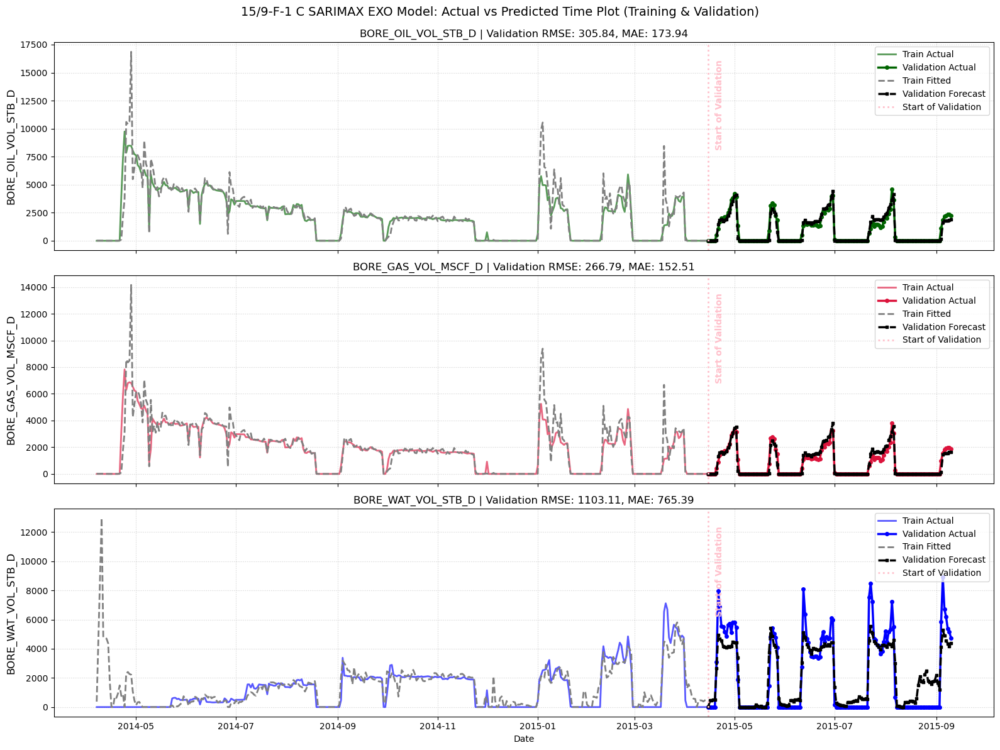

In [21]:
oil_model_key = "15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log"
oil_order_key = "15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log"
gas_order_key = "15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model"
water_order_key = "15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]


# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

# 2. Generate the Oil Plot on the first axis (axes[0])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_OIL_VOL_STB_D",
    model=sarima_exo_models_dict[oil_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
    ax=axes[0],
    start_of_val_date=start_of_val_date
)

# 3. Generate the Gas Plot on the second axis (axes[1])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_GAS_VOL_MSCF_D",
    model=sarima_exo_models_dict[gas_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
    ax=axes[1],
    start_of_val_date=start_of_val_date
)

# 4. Generate the Water Plot on the third axis (axes[2])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_WAT_VOL_STB_D",
    model=sarima_exo_models_dict[water_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
    ax=axes[2],
    start_of_val_date=start_of_val_date
)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_1["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_1["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_Time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

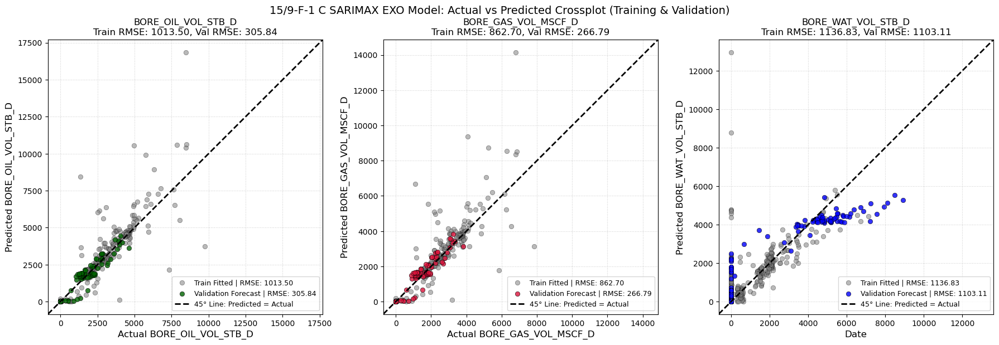

In [22]:
oil_model_key = "15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log"
oil_order_key = "15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log"
gas_order_key = "15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model"
water_order_key = "15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]



fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Oil
oil_crossplot, oil_train_rmse, oil_train_mae, oil_val_rmse, oil_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                            train_data=train_data,
                                                                            val_data=val_data,
                                                                            phase_string="BORE_OIL_VOL_STB_D",
                                                                            model=sarima_exo_models_dict[oil_model_key],
                                                                            val_exog=val_exog,
                                                                            selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
                                                                            log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
                                                                            transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
                                                                            ax=axes[0])
# Gas
gas_crossplot, gas_train_rmse, gas_train_mae, gas_val_rmse, gas_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_GAS_VOL_MSCF_D",
                                                                        model=sarima_exo_models_dict[gas_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[1])
# water
water_crossplot, water_train_rmse, water_train_mae, water_val_rmse, water_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_WAT_VOL_STB_D",
                                                                        model=sarima_exo_models_dict[water_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[2])


# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_1["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Crossplot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_1["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_cross_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# DF 2

In [23]:
df_2.head()

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,AVG_CHOKE_SIZE_P_WAS_MISSING,AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING,AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING,AVG_DP_TUBING_PSI_WAS_MISSING,AVG_ANNULUS_PRESS_PSI_WAS_MISSING,DP_CHOKE_SIZE_PSI_WAS_MISSING,AVG_WHP_P_PSI_WAS_MISSING,AVG_WHT_P_WAS_MISSING,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,0,0,0,0,0,0,0,0,1,1
2013-07-09,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,0,0,0,0,0,0,0,0,1,1
2013-07-10,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,1,1,1,1,1,1,1,1,1,1
2013-07-11,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,0,0,0,0,0,0,0,0,1,1
2013-07-12,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,0.0,%,...,1,1,1,1,1,1,1,1,1,1


In [24]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P','GOR_MSCF/STB', 'WCUT']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

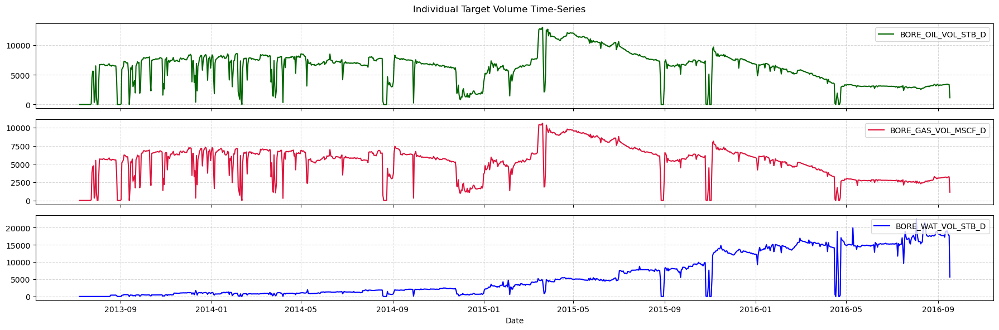

In [25]:
seperate_target_plot(df_2[target_col])

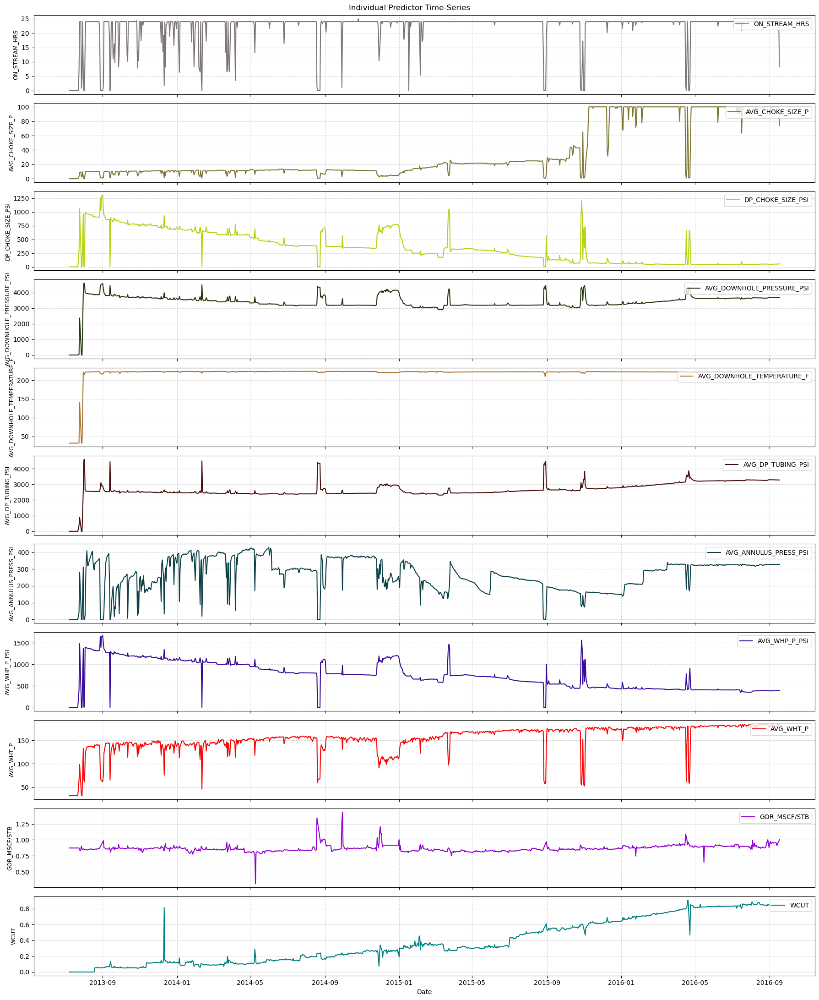

In [26]:
seperate_predictor_plot(df_2, features=predictor_num_col)

## ETS Decomposition

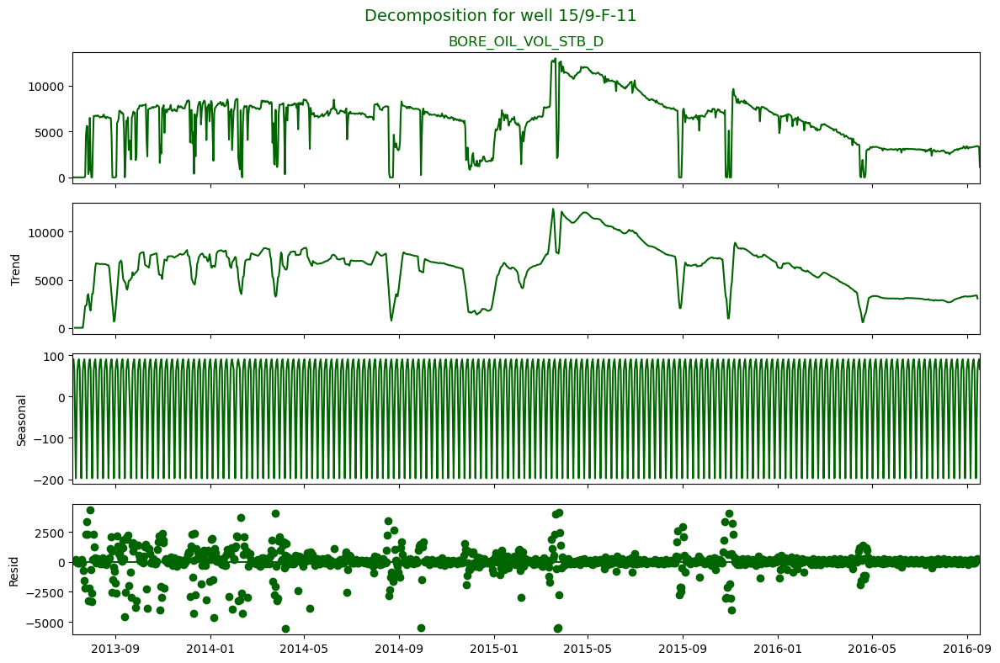

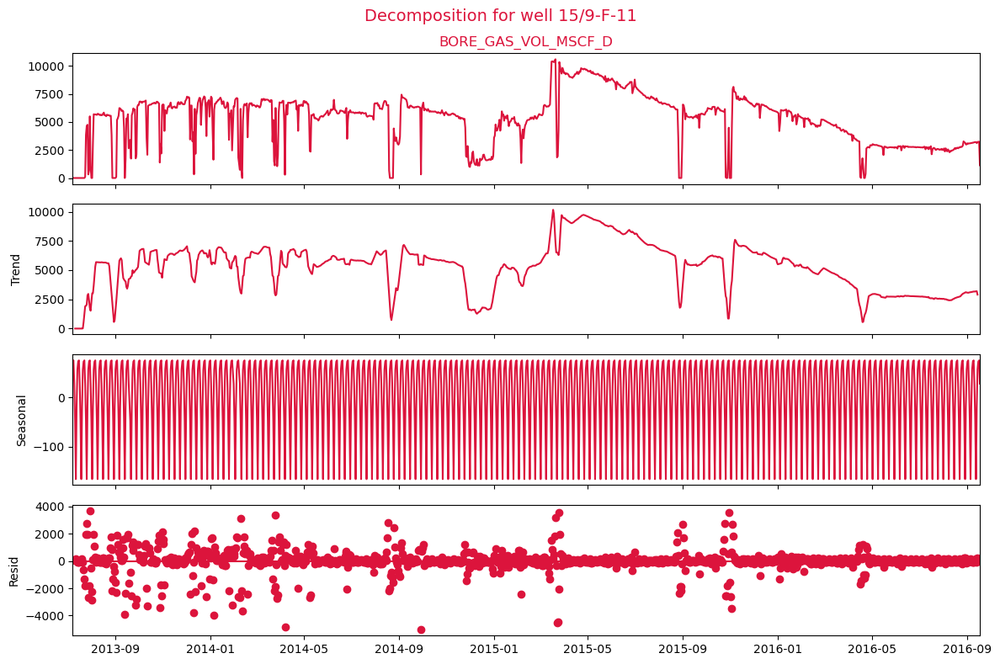

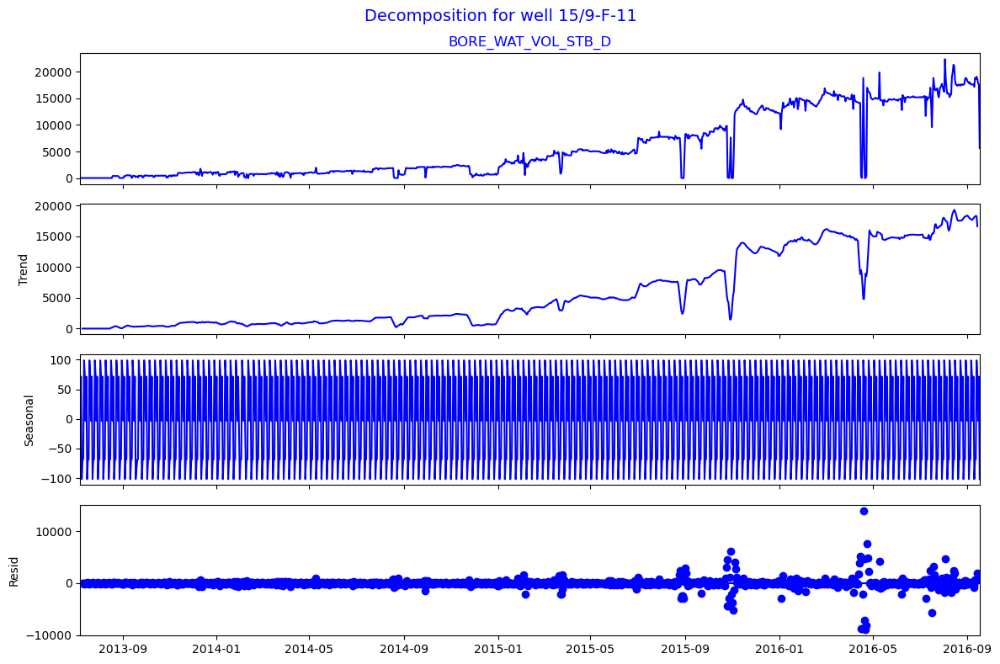

<Figure size 640x480 with 0 Axes>

In [27]:
plot_decomposition(df_2, target_col,model="additive", period=7)
plt.savefig('ets.png', dpi=300, bbox_inches='tight')

## ACF & PACF Plots and Monthly Plots

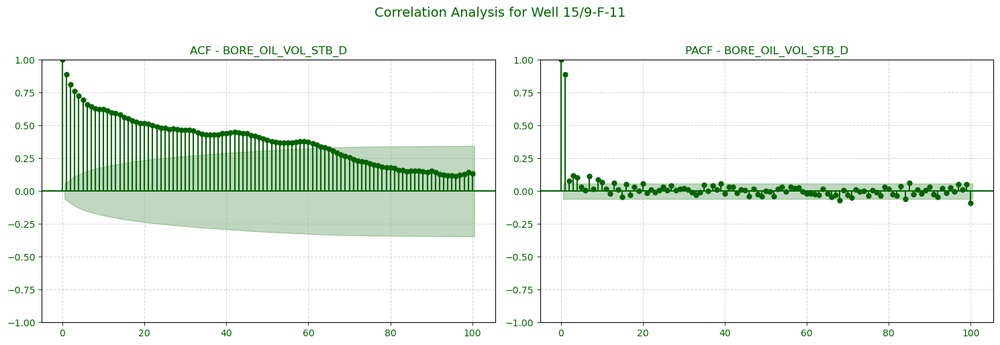

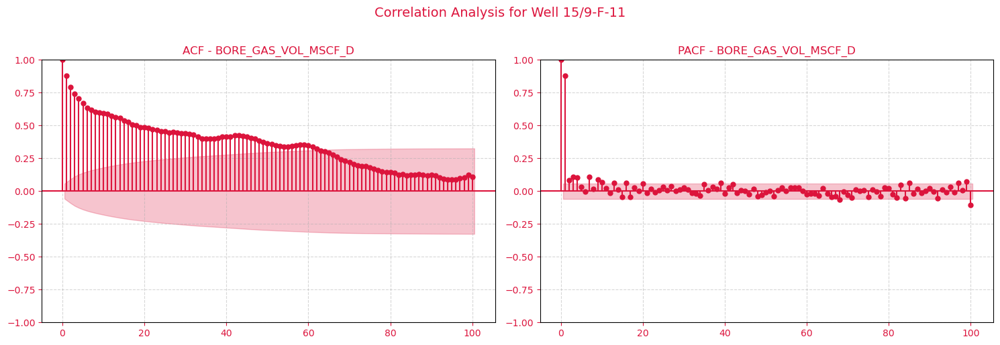

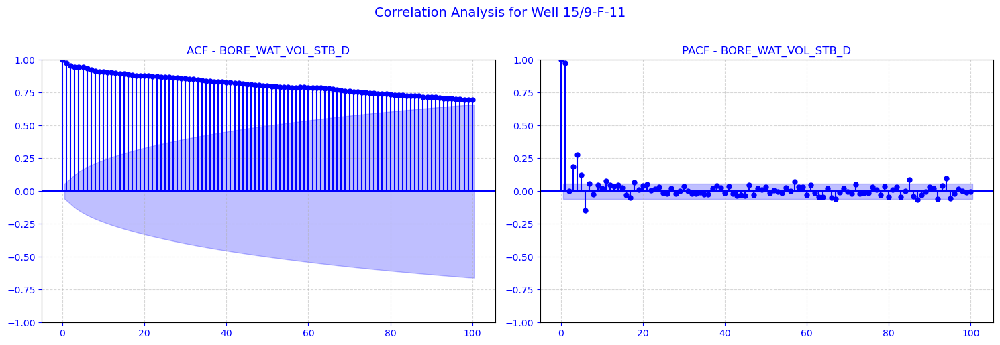

In [28]:
plot_acf_pacf_channels(df_2, target_col, lags=100)

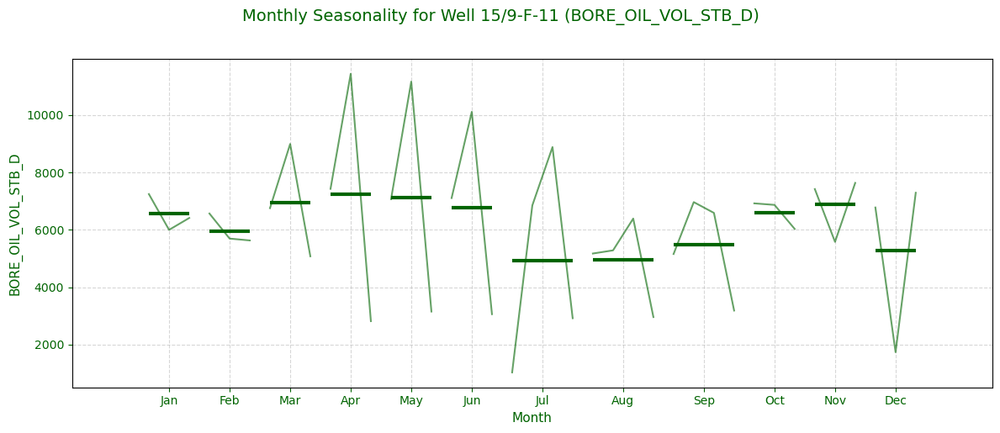

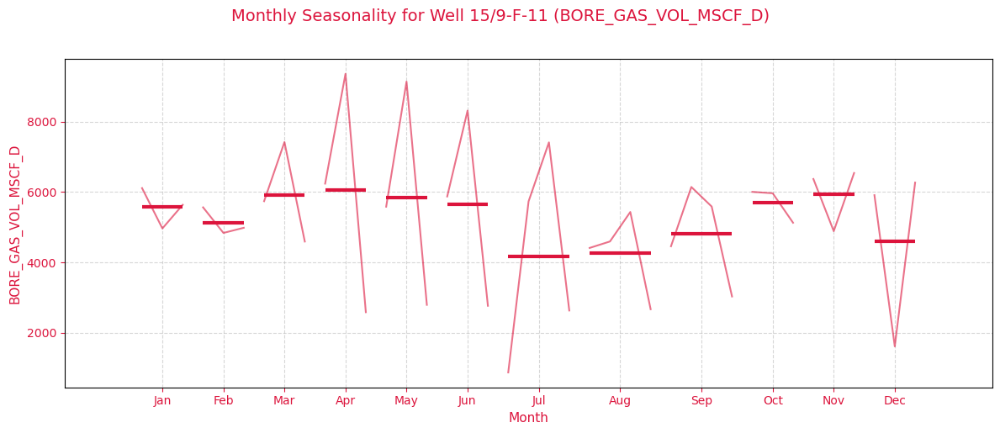

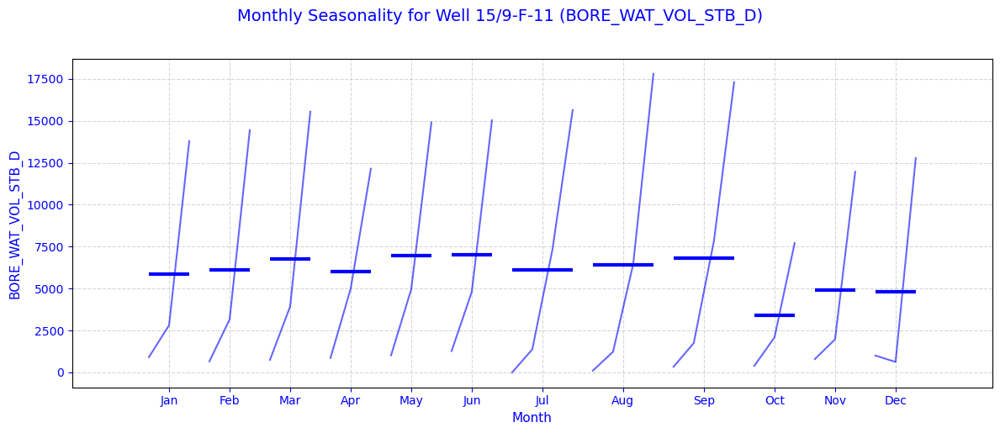

In [29]:
plot_monthly_seasonality(df_2, target_col)

## Find the best SARIMA model for Oil

In [30]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_2, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_2)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)


train_exog = train_data[predictor_num_col]
val_exog = val_data[predictor_num_col]


sarima_exo_models_dict, sarima_exo_order_dict = find_best_sarima_model_for_all_phases_optuna_EXO(
    models_dict=sarima_exo_models_dict,
    order_dict=sarima_exo_order_dict,
    target_col=target_col,
    train_data=train_data,
    test_data=val_data,
    train_exog=train_exog,
    test_exog=val_exog,
    p_max=2,
    d_max=2,
    q_max=2,
    P_max=2,
    D_max=1,
    Q_max=1,
    seasonal_period=7,
    n_trials=100,
    maxiter=50,
    feature_selection=True,
    min_exog_features=1,
    max_exog_features=8,
)

[I 2026-06-25 17:48:30,602] A new study created in memory with name: no-name-d24cbe21-080c-44de-8cc4-94c64574b74c



Running SARIMA/SARIMAX Optuna search for: 15/9-F-11 | BORE_OIL_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:48:30,856] Trial 0 finished with value: 3580.2145537766633 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 3580.2145537766633.
[I 2026-06-25 17:48:31,108] Trial 1 finished with value: 3157.329196904509 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': 

[I 2026-06-25 17:49:13,502] A new study created in memory with name: no-name-4e62d9e2-fa12-4713-a98b-2d96862d6db1


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:49:13,758] Trial 0 finished with value: 63798.28224880666 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 63798.28224880666.
[I 2026-06-25 17:49:13,966] Trial 1 finished with value: 38937.606056279525 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': T

[I 2026-06-25 17:49:40,269] A new study created in memory with name: no-name-6189dd7f-2b42-46d2-ab97-c661d211bf00



15/9-F-11 | BORE_OIL_VOL_STB_D
Normal RMSE: 2331.140698493688
Log RMSE:    871.9854179649546
Selected model: log1p scale
Selected features: ['DP_CHOKE_SIZE_PSI', 'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DP_TUBING_PSI', 'AVG_WHT_P', 'WCUT']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-11 | BORE_GAS_VOL_MSCF_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:49:40,618] Trial 0 finished with value: 3011.5429951998426 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 3011.5429951998426.
[I 2026-06-25 17:49:40,895] Trial 1 finished with value: 2962.642526623584 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': 

[I 2026-06-25 17:50:10,611] A new study created in memory with name: no-name-3f3c261f-a6b2-43a4-b922-d8256d9e57ad


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:50:10,835] Trial 0 finished with value: 50812.474539465526 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 50812.474539465526.
[I 2026-06-25 17:50:11,136] Trial 1 finished with value: 45020.18255332342 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': 

[I 2026-06-25 17:50:35,278] A new study created in memory with name: no-name-10c2a543-dfea-4774-8c43-aed0d92fc577



15/9-F-11 | BORE_GAS_VOL_MSCF_D
Normal RMSE: 1600.0207190622411
Log RMSE:    758.242074408167
Selected model: log1p scale
Selected features: ['DP_CHOKE_SIZE_PSI', 'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DP_TUBING_PSI', 'AVG_WHT_P', 'WCUT']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-11 | BORE_WAT_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:50:35,519] Trial 0 finished with value: 2398.0302167839927 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 2398.0302167839927.
[I 2026-06-25 17:50:35,787] Trial 1 finished with value: 3597.1889584129453 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB':

[I 2026-06-25 17:51:25,286] A new study created in memory with name: no-name-be9b0ef0-b8f5-426b-88dc-2351ac3c2037


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:51:25,521] Trial 0 finished with value: 54083.96408608941 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 54083.96408608941.
[I 2026-06-25 17:51:25,843] Trial 1 finished with value: 4278.313667562044 and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': Tr

In [31]:
sarima_exo_models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1874590>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1157890>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eab8f51110>,
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac18589d0>,
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1314950>,
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac168ce90>}

In [32]:
sarima_exo_order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(305.8414160976389),
  'mse': np.float64(93538.9718006091),
  'mae': np.float64(173.97099224149366),
  'aic': np.float64(831.5836513283731),
  'bic': np.float64(874.2078893677455),
  'selected_features': ['ON_STREAM_HRS',
   'AVG_DOWNHOLE_TEMPERATURE_F',
   'AVG_DP_TUBING_PSI',
   'AVG_WHP_P_PSI',
   'AVG_WHT_P'],
  'model_key': '15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log'},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(266.78650008461653),
  'mse': np.float64(71175.03662739911),
  'mae': np.float64(152.5422615021109),
  'aic': np.float64(823.1306543499345),
  'bic': np.float64(865.7548923893069),
  'selected_features': ['ON_STR

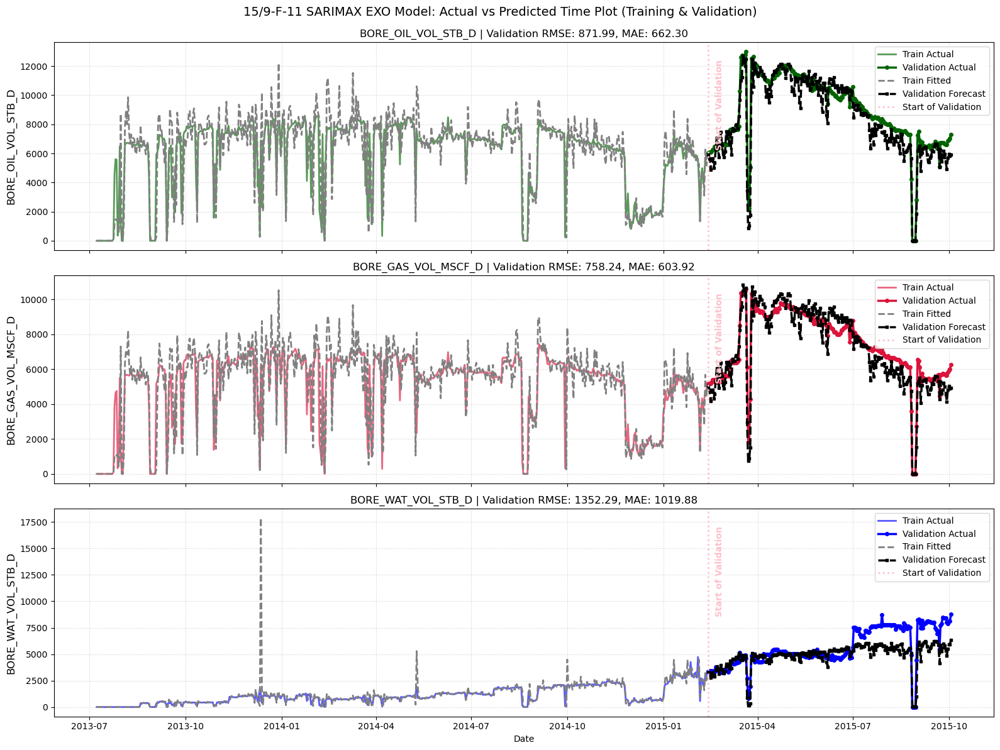

In [33]:
oil_model_key = "15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_log"
oil_order_key = "15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_log_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_log"
gas_order_key = "15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_log_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_log"
water_order_key = "15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_log_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]


# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

# 2. Generate the Oil Plot on the first axis (axes[0])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_OIL_VOL_STB_D",
    model=sarima_exo_models_dict[oil_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
    ax=axes[0],
    start_of_val_date=start_of_val_date
)

# 3. Generate the Gas Plot on the second axis (axes[1])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_GAS_VOL_MSCF_D",
    model=sarima_exo_models_dict[gas_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
    ax=axes[1],
    start_of_val_date=start_of_val_date
)

# 4. Generate the Water Plot on the third axis (axes[2])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_WAT_VOL_STB_D",
    model=sarima_exo_models_dict[water_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
    ax=axes[2],
    start_of_val_date=start_of_val_date
)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_2["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_2["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_Time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

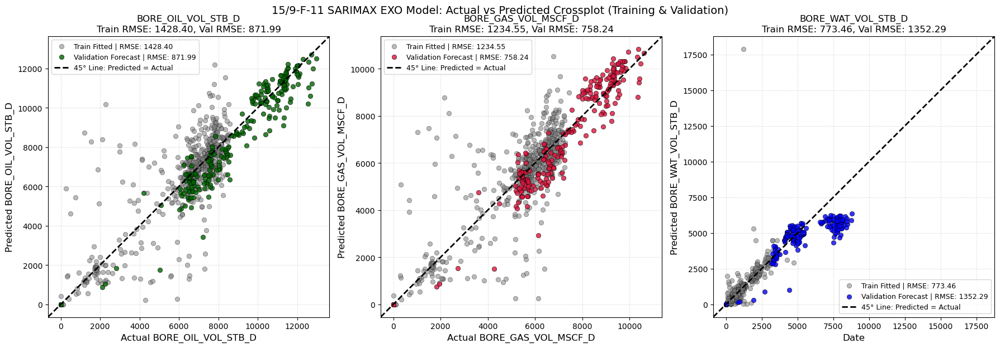

In [34]:
oil_model_key = "15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_log"
oil_order_key = "15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_log_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_log"
gas_order_key = "15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_log_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_log"
water_order_key = "15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_log_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]



fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Oil
oil_crossplot, oil_train_rmse, oil_train_mae, oil_val_rmse, oil_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                            train_data=train_data,
                                                                            val_data=val_data,
                                                                            phase_string="BORE_OIL_VOL_STB_D",
                                                                            model=sarima_exo_models_dict[oil_model_key],
                                                                            val_exog=val_exog,
                                                                            selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
                                                                            log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
                                                                            transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
                                                                            ax=axes[0])
# Gas
gas_crossplot, gas_train_rmse, gas_train_mae, gas_val_rmse, gas_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_GAS_VOL_MSCF_D",
                                                                        model=sarima_exo_models_dict[gas_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[1])
# water
water_crossplot, water_train_rmse, water_train_mae, water_val_rmse, water_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_WAT_VOL_STB_D",
                                                                        model=sarima_exo_models_dict[water_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[2])


# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_2["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Crossplot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_2["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_cross_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# DF3

In [35]:
df_3.head()

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,GOR_MSCF/STB,WCUT,AVG_CHOKE_SIZE_P_WAS_MISSING,AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING,AVG_DP_TUBING_PSI_WAS_MISSING,AVG_ANNULUS_PRESS_PSI_WAS_MISSING,BORE_WAT_VOL_STB_D_WAS_NEGATIVE,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING,WCUT_WAS_NEGATIVE
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2008-02-12,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,11.50,14.484431,%,...,0.767061,0.574934,0,0,0,0,0,0,0,0
2008-02-13,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00,22.832986,%,...,0.856576,0.003799,0,0,0,0,0,0,0,0
2008-02-14,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,22.50,31.249966,%,...,0.916487,0.000371,0,0,0,0,0,0,0,0
2008-02-15,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,23.15,28.518930,%,...,0.825365,0.000372,0,0,0,0,0,0,0,0
2008-02-16,NO 15/9-F-12 H,5599,15/9-F-12,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00,30.227902,%,...,0.769893,0.001600,0,0,0,0,0,0,0,0


In [36]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P','GOR_MSCF/STB', 'WCUT']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

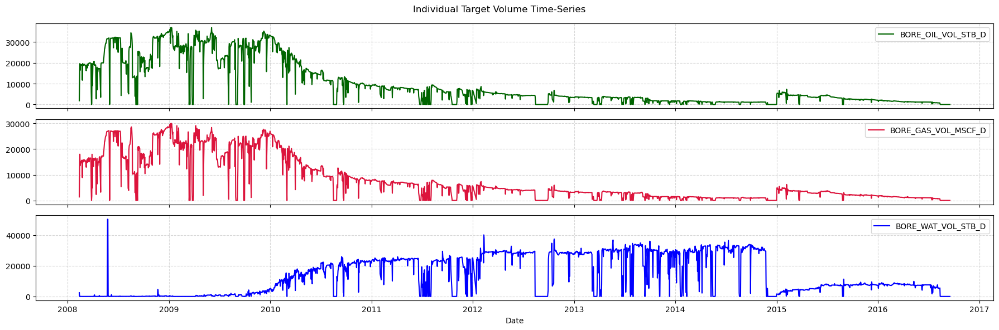

In [37]:
seperate_target_plot(df_3[target_col])

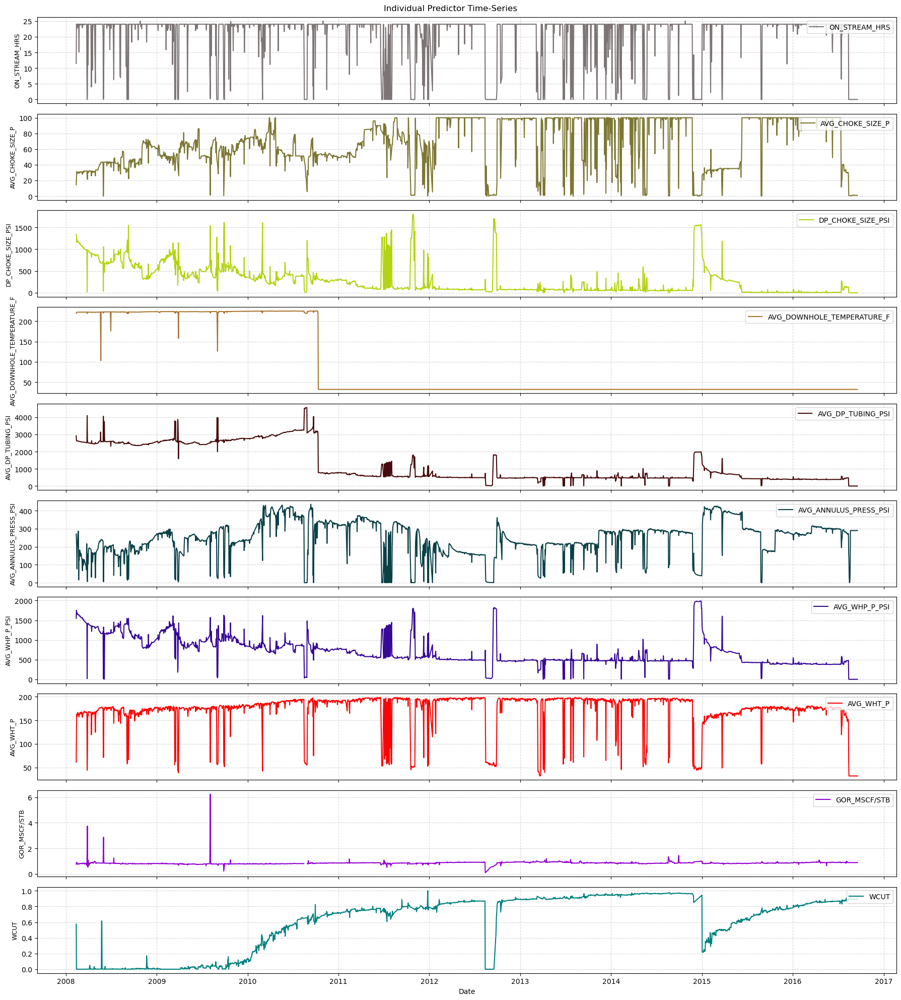

In [38]:
seperate_predictor_plot(df_3, features=predictor_num_col)

## ETS Decomposition

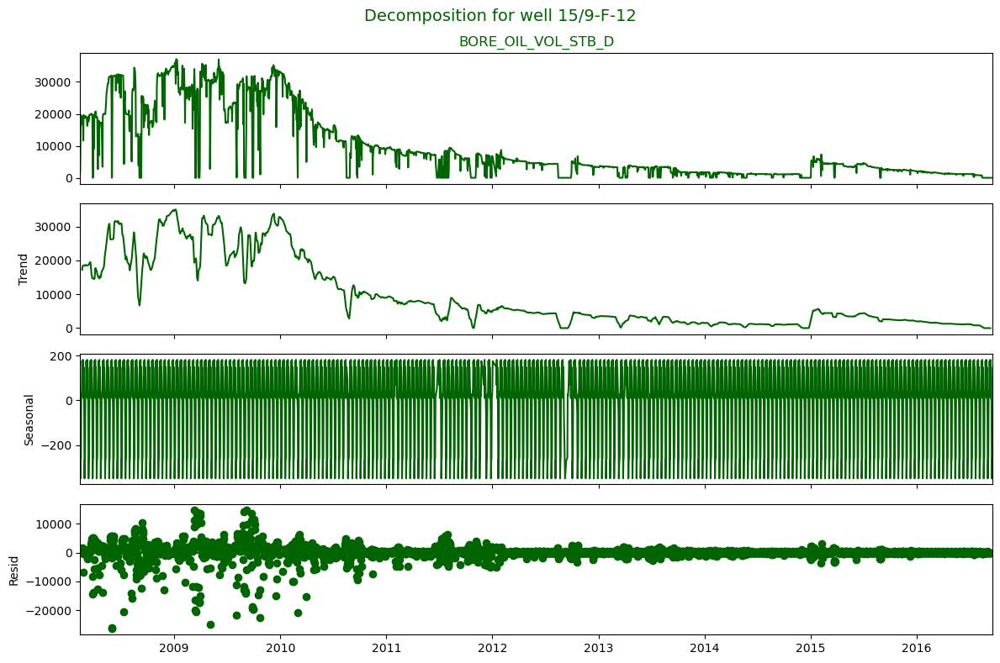

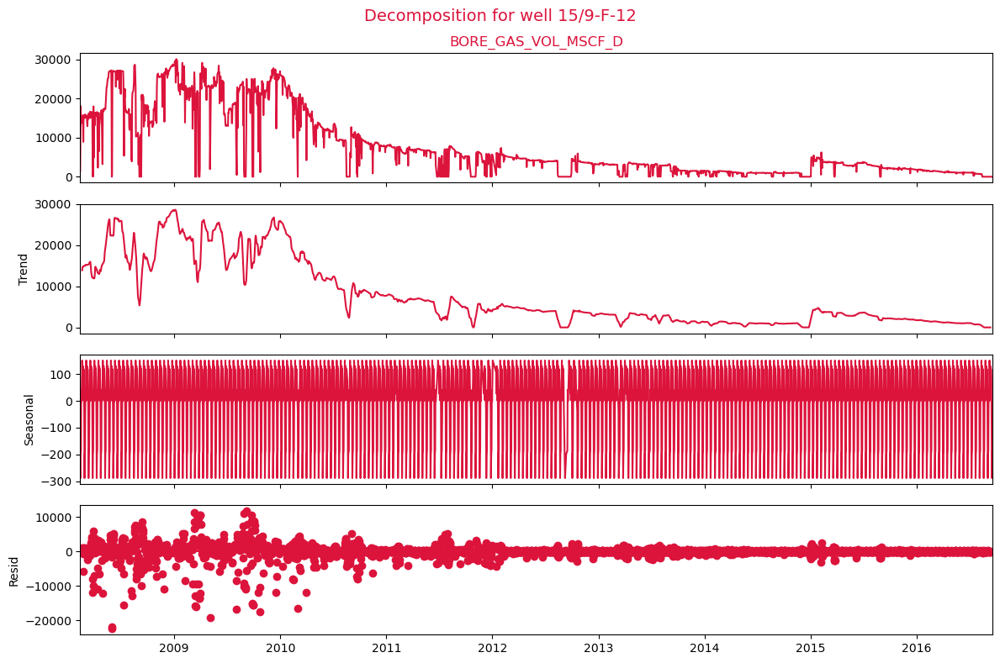

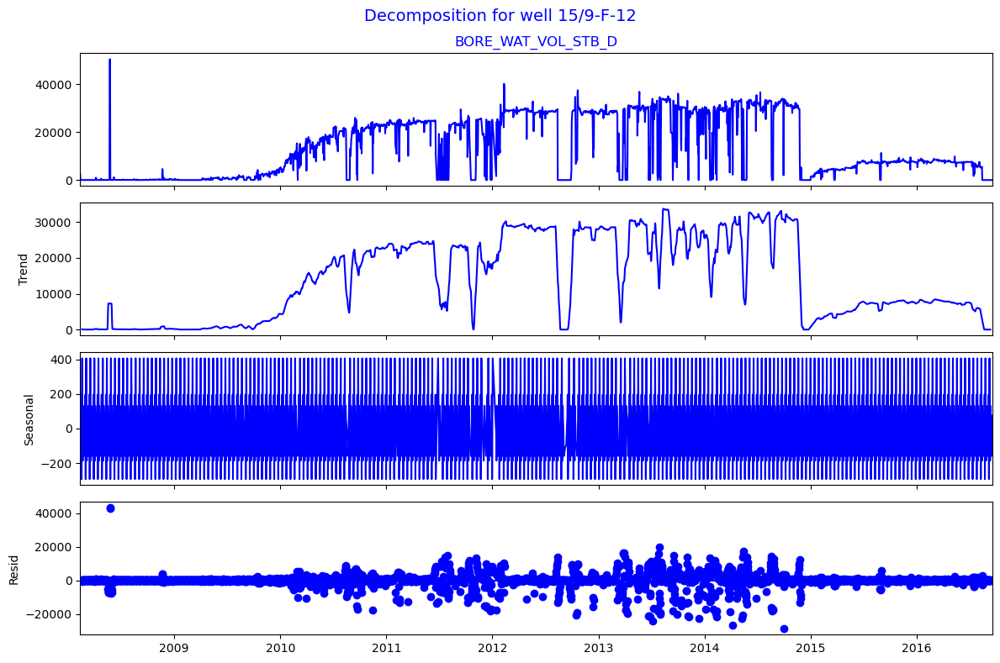

<Figure size 640x480 with 0 Axes>

In [39]:
plot_decomposition(df_3, target_col,model="additive", period=14)
plt.savefig('ets.png', dpi=300, bbox_inches='tight')

## ACF & PACF Plots and Monthly Plots

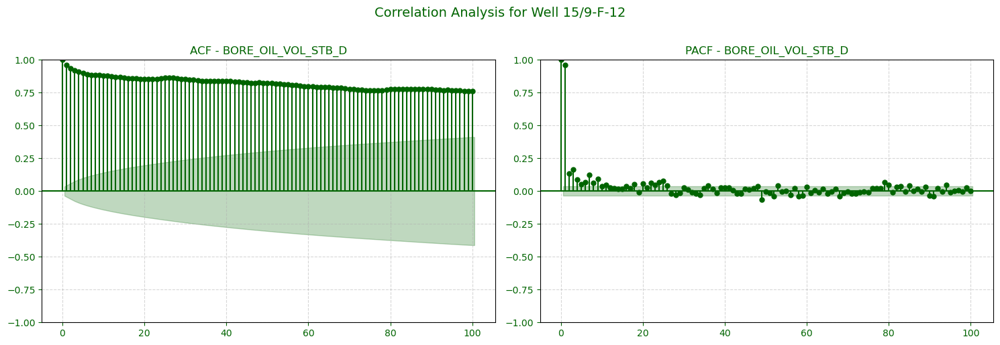

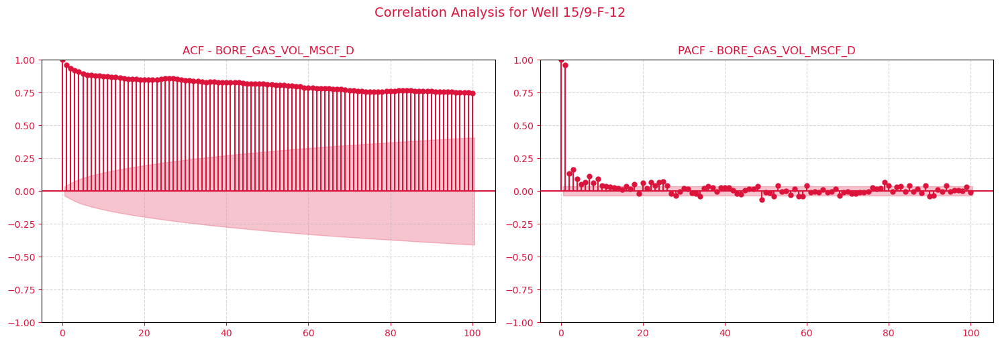

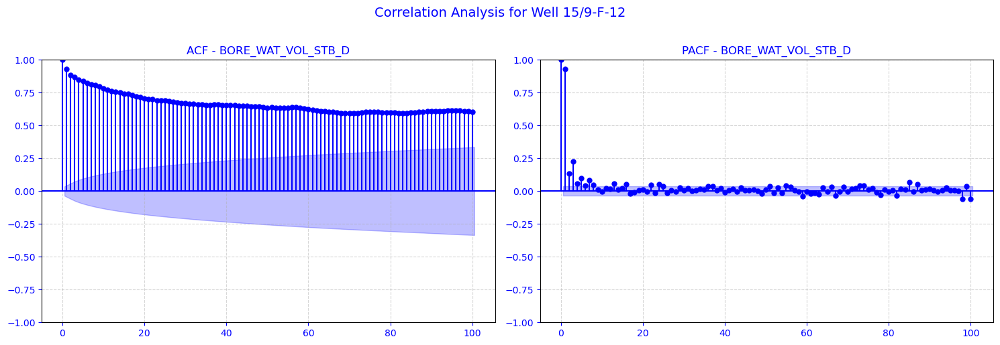

In [40]:
plot_acf_pacf_channels(df_3, target_col, lags=100)

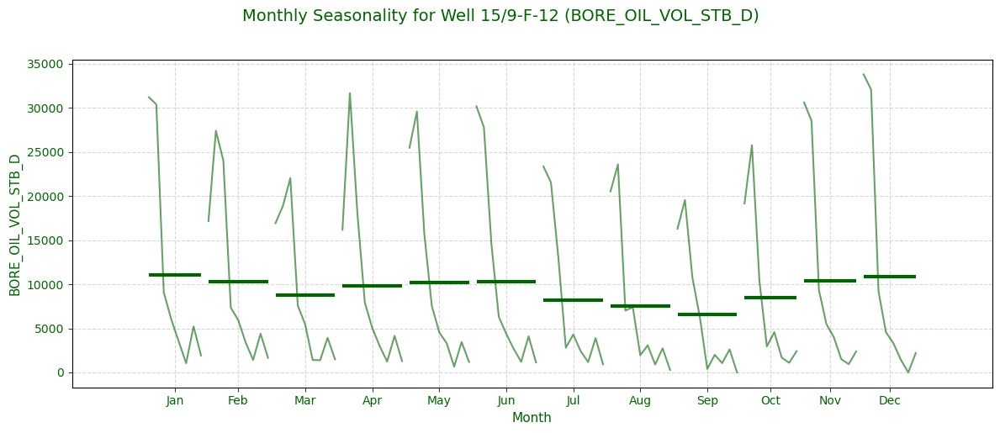

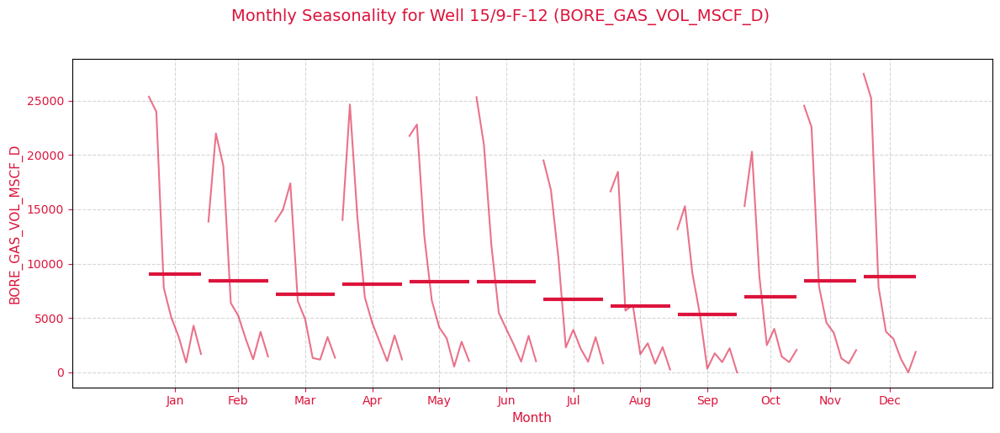

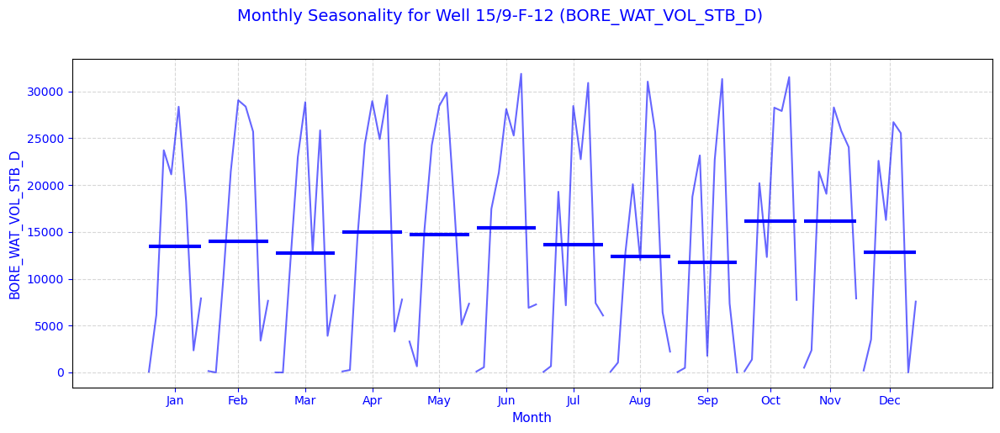

In [41]:
plot_monthly_seasonality(df_3, target_col)

## Find the best SARIMA model

In [42]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_3, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_3)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)


train_exog = train_data[predictor_num_col]
val_exog = val_data[predictor_num_col]


sarima_exo_models_dict, sarima_exo_order_dict = find_best_sarima_model_for_all_phases_optuna_EXO(
    models_dict=sarima_exo_models_dict,
    order_dict=sarima_exo_order_dict,
    target_col=target_col,
    train_data=train_data,
    test_data=val_data,
    train_exog=train_exog,
    test_exog=val_exog,
    p_max=2,
    d_max=1,
    q_max=2,
    P_max=2,
    D_max=1,
    Q_max=1,
    seasonal_period=7,
    n_trials=100,
    maxiter=50,
    feature_selection=True,
    min_exog_features=1,
    max_exog_features=8,
)

[I 2026-06-25 17:51:55,282] A new study created in memory with name: no-name-fc9bea8a-a8f1-48a9-b174-499ff719f424



Running SARIMA/SARIMAX Optuna search for: 15/9-F-12 | BORE_OIL_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:51:55,803] Trial 0 finished with value: 3375.779251283722 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 3375.779251283722.
[I 2026-06-25 17:51:55,806] Trial 1 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 3375.779251283722.
[I 2026-06-25 17:51:56

[I 2026-06-25 17:52:54,930] A new study created in memory with name: no-name-e208e0da-9444-481a-bb7a-399c94b8f103


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:52:55,417] Trial 0 finished with value: 1412.5476612969437 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 1412.5476612969437.
[I 2026-06-25 17:52:55,420] Trial 1 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 1412.5476612969437.
[I 2026-06-25 17:52

[I 2026-06-25 17:53:42,346] A new study created in memory with name: no-name-24c9f925-b2b6-405c-8504-b9326a637a13



15/9-F-12 | BORE_OIL_VOL_STB_D
Normal RMSE: 2191.2510202892186
Log RMSE:    912.137370771965
Selected model: log1p scale
Selected features: ['ON_STREAM_HRS', 'DP_CHOKE_SIZE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'AVG_ANNULUS_PRESS_PSI', 'AVG_WHT_P']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-12 | BORE_GAS_VOL_MSCF_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:53:42,887] Trial 0 finished with value: 2728.1672196504574 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 2728.1672196504574.
[I 2026-06-25 17:53:42,890] Trial 1 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 2728.1672196504574.
[I 2026-06-25 17:53

[I 2026-06-25 17:54:22,261] A new study created in memory with name: no-name-45562023-966e-4c43-89b9-213ee6693923


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:54:22,942] Trial 0 finished with value: 1321.6999733163832 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 1321.6999733163832.
[I 2026-06-25 17:54:22,944] Trial 1 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 1321.6999733163832.
[I 2026-06-25 17:54

[I 2026-06-25 17:55:06,292] A new study created in memory with name: no-name-633524ef-c540-4779-a5e0-ab66e3750133



15/9-F-12 | BORE_GAS_VOL_MSCF_D
Normal RMSE: 1794.8043450147
Log RMSE:    574.9540140314442
Selected model: log1p scale
Selected features: ['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'DP_CHOKE_SIZE_PSI']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-12 | BORE_WAT_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:55:06,753] Trial 0 finished with value: 8151.2772232454645 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 8151.2772232454645.
[I 2026-06-25 17:55:06,756] Trial 1 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 8151.2772232454645.
[I 2026-06-25 17:55

[I 2026-06-25 17:56:39,588] A new study created in memory with name: no-name-1b114c5e-7b55-484d-b307-6d692bfad6f0


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:56:40,190] Trial 0 finished with value: 4977.84893777181 and parameters: {'p': 1, 'd': 1, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 4977.84893777181.
[I 2026-06-25 17:56:40,193] Trial 1 finished with value: inf and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 4977.84893777181.
[I 2026-06-25 17:56:41,37

In [43]:
sarima_exo_models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1874590>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1157890>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eab8f51110>,
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac18589d0>,
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1314950>,
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac168ce90>,
 '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eab8d846d0>,
 '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWr

In [44]:
sarima_exo_order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(305.8414160976389),
  'mse': np.float64(93538.9718006091),
  'mae': np.float64(173.97099224149366),
  'aic': np.float64(831.5836513283731),
  'bic': np.float64(874.2078893677455),
  'selected_features': ['ON_STREAM_HRS',
   'AVG_DOWNHOLE_TEMPERATURE_F',
   'AVG_DP_TUBING_PSI',
   'AVG_WHP_P_PSI',
   'AVG_WHT_P'],
  'model_key': '15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log'},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(266.78650008461653),
  'mse': np.float64(71175.03662739911),
  'mae': np.float64(152.5422615021109),
  'aic': np.float64(823.1306543499345),
  'bic': np.float64(865.7548923893069),
  'selected_features': ['ON_STR

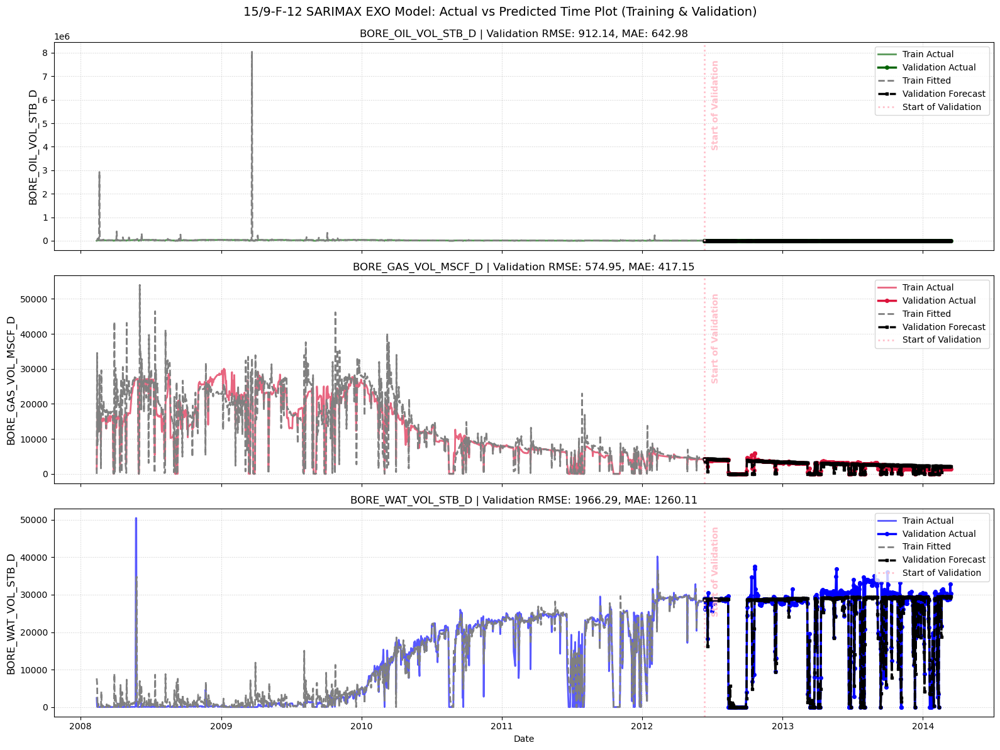

In [45]:
oil_model_key = "15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model_log"
oil_order_key = "15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model_log_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model_log"
gas_order_key = "15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model_log_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-12_BORE_WAT_VOL_STB_D_sarima_model"
water_order_key = "15/9-F-12_BORE_WAT_VOL_STB_D_sarima_model_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]


# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

# 2. Generate the Oil Plot on the first axis (axes[0])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_OIL_VOL_STB_D",
    model=sarima_exo_models_dict[oil_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
    ax=axes[0],
    start_of_val_date=start_of_val_date
)

# 3. Generate the Gas Plot on the second axis (axes[1])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_GAS_VOL_MSCF_D",
    model=sarima_exo_models_dict[gas_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
    ax=axes[1],
    start_of_val_date=start_of_val_date
)

# 4. Generate the Water Plot on the third axis (axes[2])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_WAT_VOL_STB_D",
    model=sarima_exo_models_dict[water_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
    ax=axes[2],
    start_of_val_date=start_of_val_date
)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_3["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_3["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_Time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

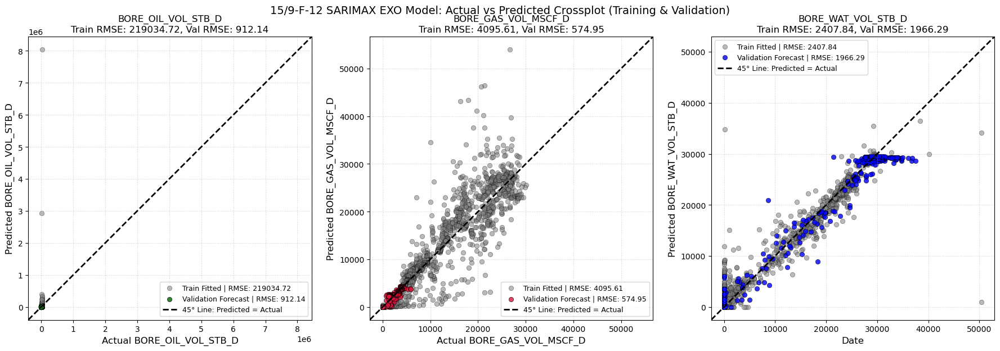

In [46]:
oil_model_key = "15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model_log"
oil_order_key = "15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model_log_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model_log"
gas_order_key = "15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model_log_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-12_BORE_WAT_VOL_STB_D_sarima_model"
water_order_key = "15/9-F-12_BORE_WAT_VOL_STB_D_sarima_model_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]



fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Oil
oil_crossplot, oil_train_rmse, oil_train_mae, oil_val_rmse, oil_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                            train_data=train_data,
                                                                            val_data=val_data,
                                                                            phase_string="BORE_OIL_VOL_STB_D",
                                                                            model=sarima_exo_models_dict[oil_model_key],
                                                                            val_exog=val_exog,
                                                                            selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
                                                                            log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
                                                                            transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
                                                                            ax=axes[0])
# Gas
gas_crossplot, gas_train_rmse, gas_train_mae, gas_val_rmse, gas_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_GAS_VOL_MSCF_D",
                                                                        model=sarima_exo_models_dict[gas_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[1])
# water
water_crossplot, water_train_rmse, water_train_mae, water_val_rmse, water_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_WAT_VOL_STB_D",
                                                                        model=sarima_exo_models_dict[water_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[2])


# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_3["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Crossplot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_3["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_cross_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# DF4

In [47]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_ANNULUS_PRESS_PSI',
       'AVG_DP_TUBING_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P','GOR_MSCF/STB', 'WCUT']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

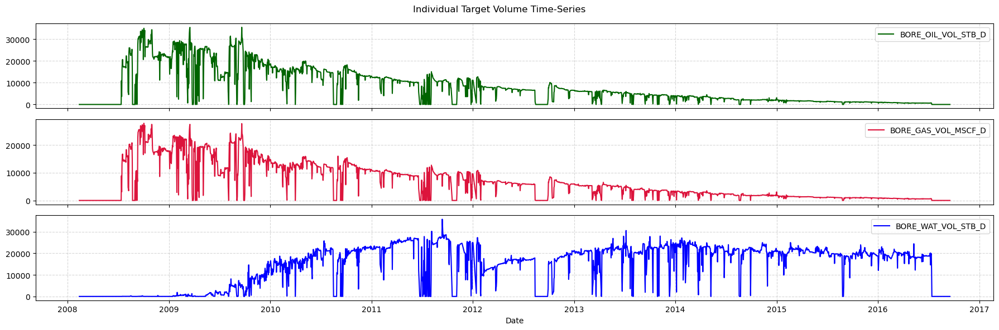

In [48]:
seperate_target_plot(df_4[target_col])

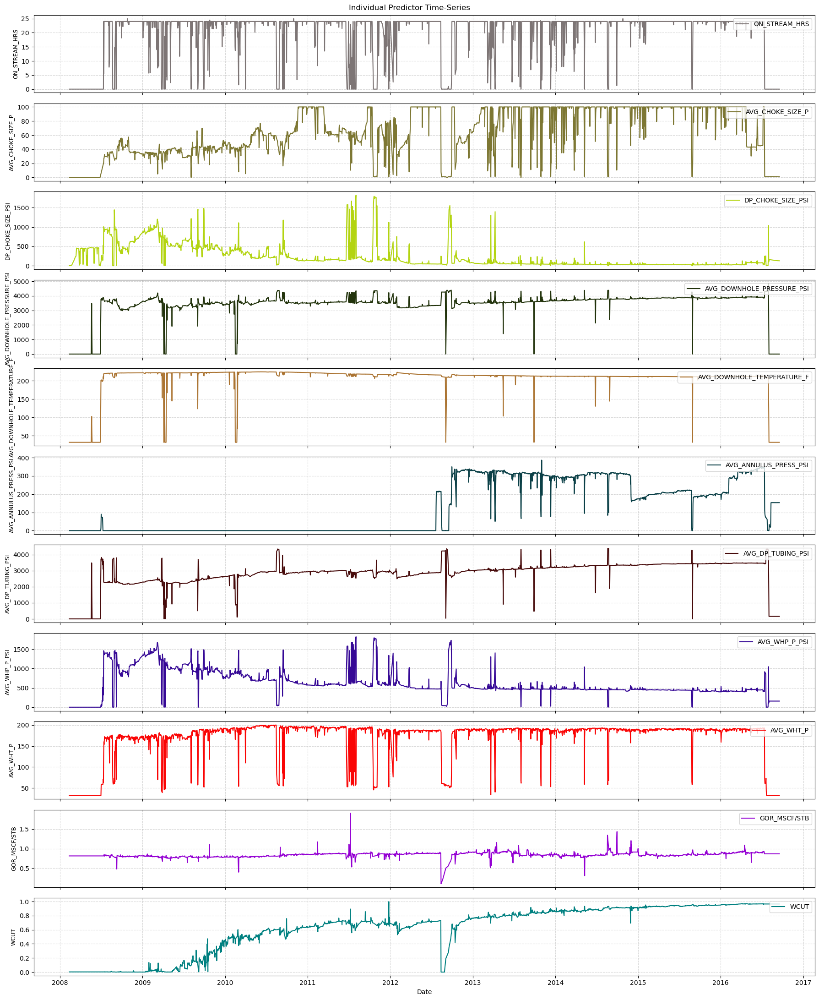

In [49]:
seperate_predictor_plot(df_4, features=predictor_num_col)

## ETS Decomposition

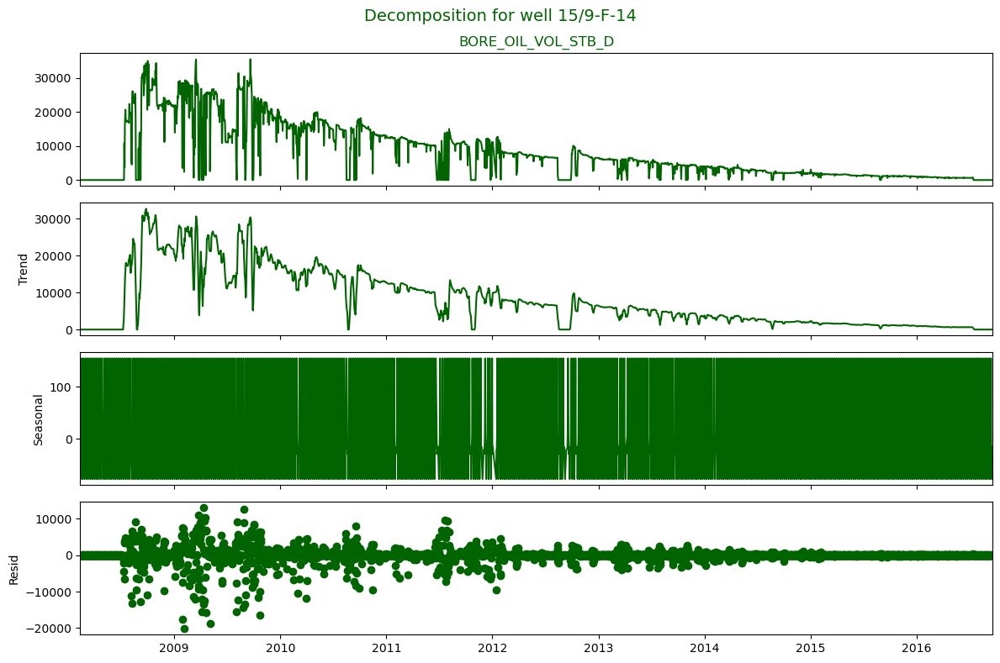

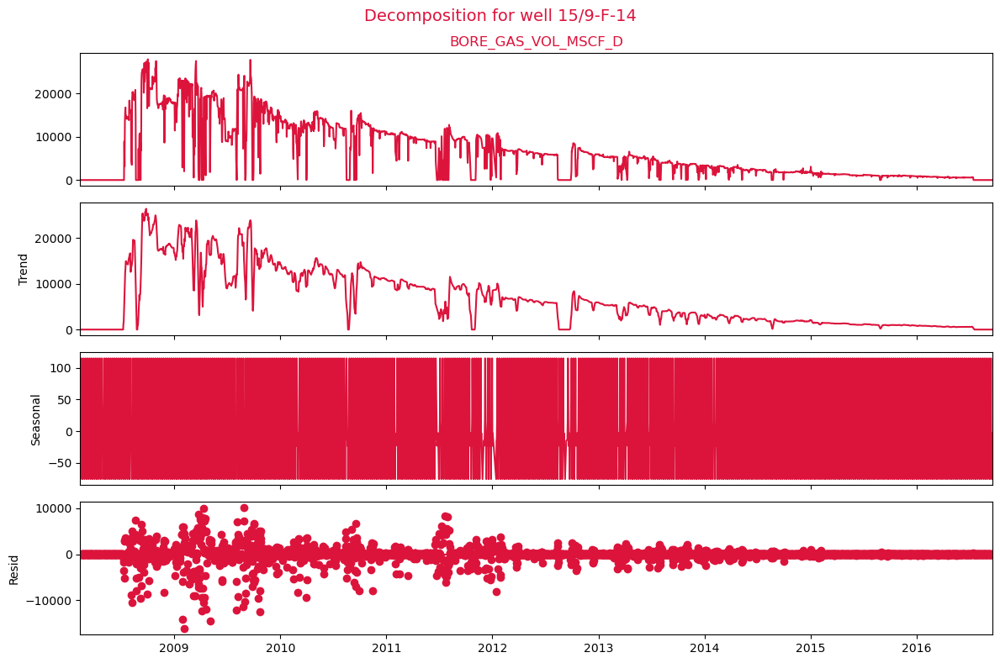

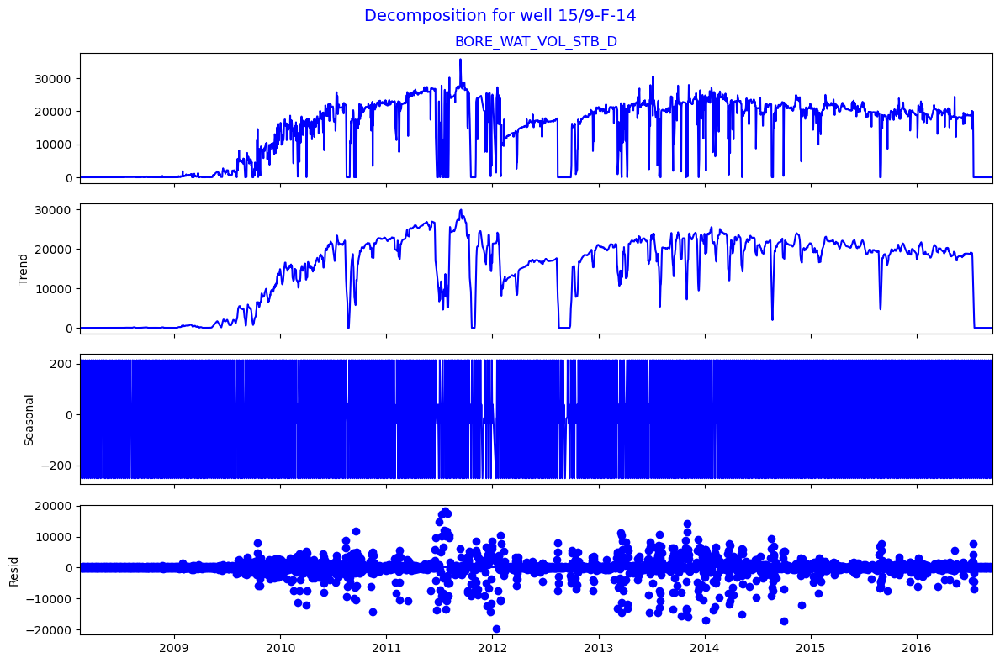

<Figure size 640x480 with 0 Axes>

In [50]:
plot_decomposition(df_4, target_col,model="additive", period=7)
plt.savefig('ets.png', dpi=300, bbox_inches='tight')

## ACF & PACF Plots and Monthly Plots

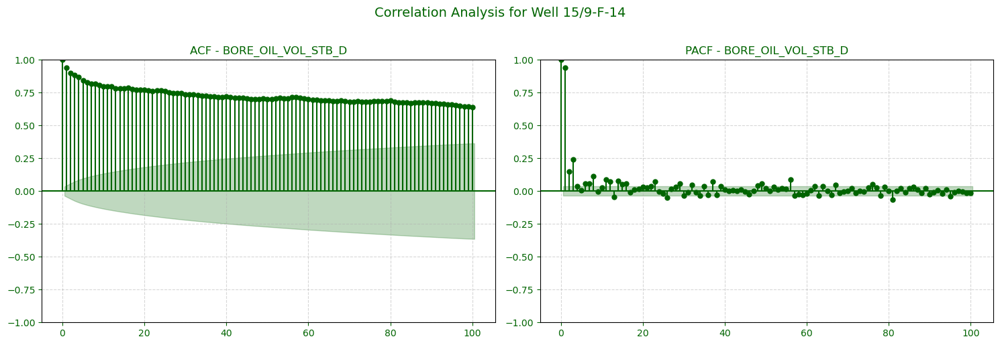

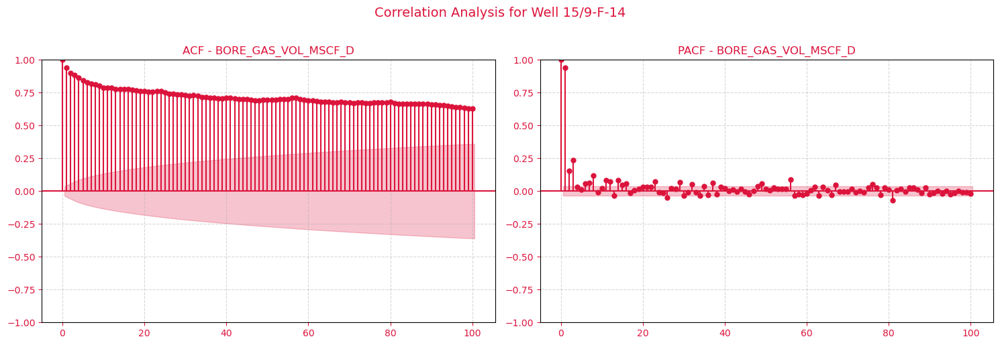

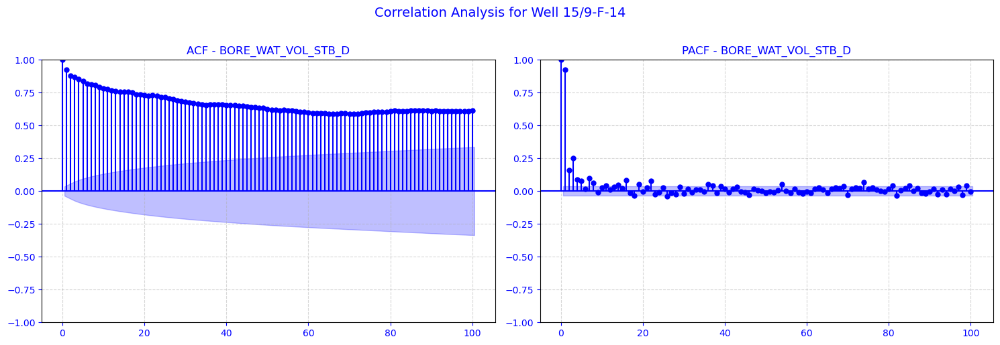

In [51]:
plot_acf_pacf_channels(df_4, target_col, lags=100)

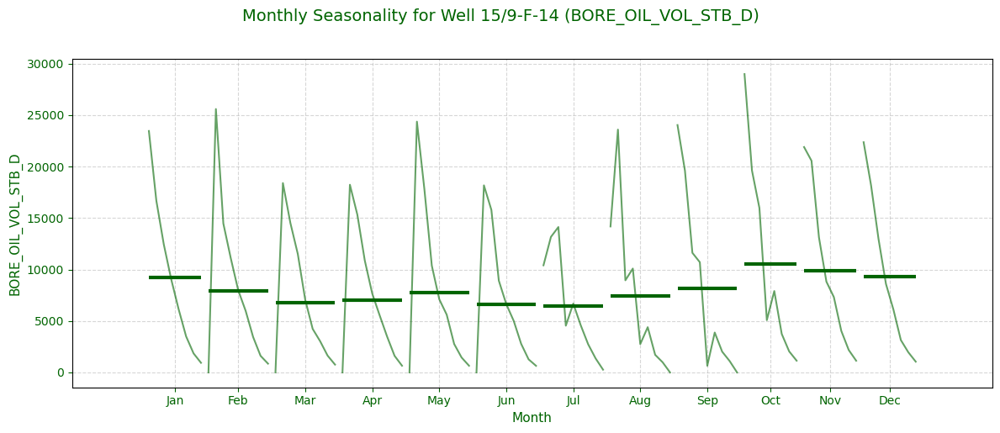

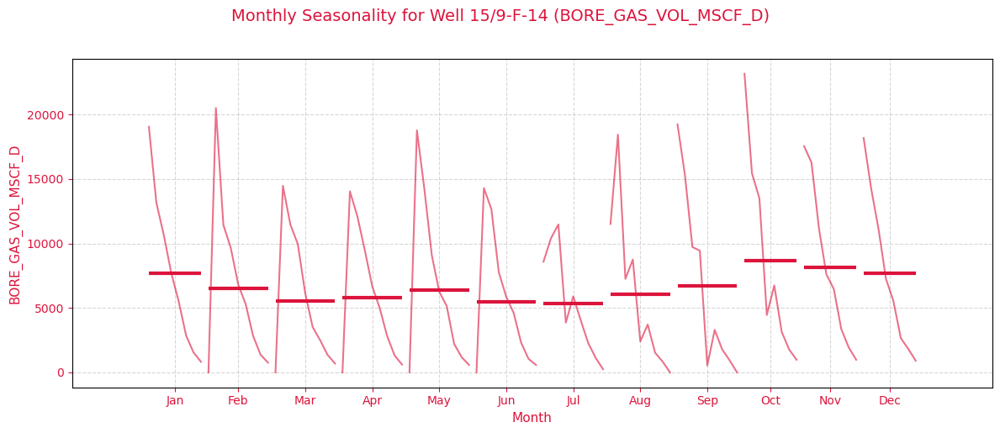

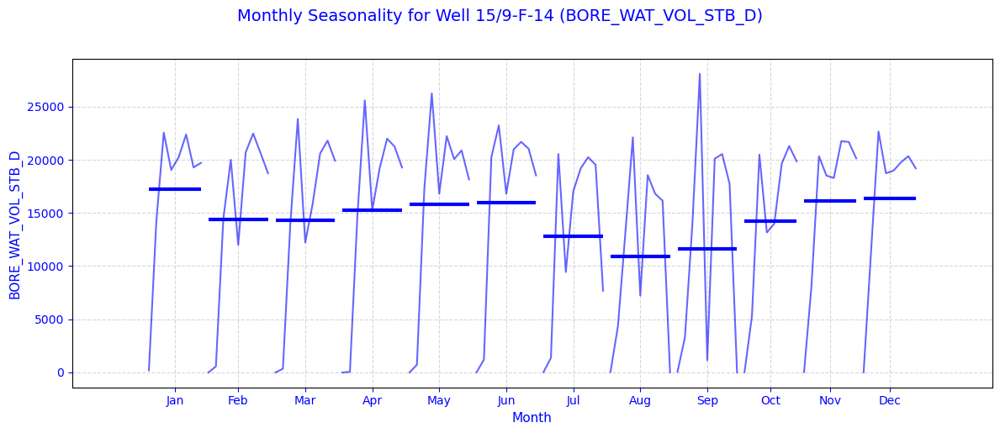

In [52]:
plot_monthly_seasonality(df_4, target_col)

## Find the best SARIMA model

In [53]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_4, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_1)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)


train_exog = train_data[predictor_num_col]
val_exog = val_data[predictor_num_col]


sarima_exo_models_dict, sarima_exo_order_dict = find_best_sarima_model_for_all_phases_optuna_EXO(
    models_dict=sarima_exo_models_dict,
    order_dict=sarima_exo_order_dict,
    target_col=target_col,
    train_data=train_data,
    test_data=val_data,
    train_exog=train_exog,
    test_exog=val_exog,
    p_max=2,
    d_max=2,
    q_max=2,
    P_max=2,
    D_max=1,
    Q_max=1,
    seasonal_period=7,
    n_trials=100,
    maxiter=50,
    feature_selection=True,
    min_exog_features=1,
    max_exog_features=10,
)

[I 2026-06-25 17:57:38,294] A new study created in memory with name: no-name-8d914bca-04e6-45d8-b796-b50993e00483



Running SARIMA/SARIMAX Optuna search for: 15/9-F-14 | BORE_OIL_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:57:38,778] Trial 0 finished with value: 2574.2659385187194 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 2574.2659385187194.
[I 2026-06-25 17:57:38,781] Trial 1 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': True, 'use_WCU

[I 2026-06-25 17:58:12,388] A new study created in memory with name: no-name-9f793313-7974-4742-b11f-6021e17a7cb5


[I 2026-06-25 17:58:12,209] Trial 99 finished with value: 5952.3594201264905 and parameters: {'p': 0, 'd': 1, 'q': 0, 'P': 2, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': True, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': True}. Best is trial 59 with value: 1515.8509878851423.


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:58:13,023] Trial 0 finished with value: 206122.94601810232 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 206122.94601810232.
[I 2026-06-25 17:58:13,027] Trial 1 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': True, 'use_WCU

[I 2026-06-25 17:59:39,677] A new study created in memory with name: no-name-7f195c4f-9040-46c2-a6a7-b1ee5aa1ba91



15/9-F-14 | BORE_OIL_VOL_STB_D
Normal RMSE: 1515.8509878851423
Log RMSE:    902.023155864953
Selected model: log1p scale
Selected features: ['ON_STREAM_HRS', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-14 | BORE_GAS_VOL_MSCF_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 17:59:40,285] Trial 0 finished with value: 2555.83626665659 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 2555.83626665659.
[I 2026-06-25 17:59:40,288] Trial 1 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': True, 'use_WCUT': 

[I 2026-06-25 18:00:30,843] A new study created in memory with name: no-name-8c61188e-f217-4648-a915-b5f6815f30fe


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:00:31,548] Trial 0 finished with value: 308218.18342314323 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 308218.18342314323.
[I 2026-06-25 18:00:31,552] Trial 1 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': True, 'use_WCU

[I 2026-06-25 18:01:14,363] A new study created in memory with name: no-name-ae4092a9-521d-4909-a80e-21a01c930696



15/9-F-14 | BORE_GAS_VOL_MSCF_D
Normal RMSE: 1426.3082714402772
Log RMSE:    1521.5564899736282
Selected model: normal scale
Selected features: ['DP_CHOKE_SIZE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI', 'AVG_WHT_P', 'WCUT']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-14 | BORE_WAT_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:01:14,737] Trial 0 finished with value: 6315.113215581408 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 6315.113215581408.
[I 2026-06-25 18:01:14,740] Trial 1 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': True, 'use_WCUT'

[I 2026-06-25 18:02:20,998] A new study created in memory with name: no-name-fa4f09dc-f6fb-48a7-aefc-078a112363cb


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:02:21,643] Trial 0 finished with value: 1348683.8266446409 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 1348683.8266446409.
[I 2026-06-25 18:02:21,646] Trial 1 finished with value: inf and parameters: {'p': 1, 'd': 0, 'q': 1, 'P': 0, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_ANNULUS_PRESS_PSI': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': True, 'use_WCU

In [54]:
sarima_exo_models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1874590>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1157890>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eab8f51110>,
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac18589d0>,
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1314950>,
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac168ce90>,
 '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eab8d846d0>,
 '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWr

In [55]:
sarima_exo_order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(305.8414160976389),
  'mse': np.float64(93538.9718006091),
  'mae': np.float64(173.97099224149366),
  'aic': np.float64(831.5836513283731),
  'bic': np.float64(874.2078893677455),
  'selected_features': ['ON_STREAM_HRS',
   'AVG_DOWNHOLE_TEMPERATURE_F',
   'AVG_DP_TUBING_PSI',
   'AVG_WHP_P_PSI',
   'AVG_WHT_P'],
  'model_key': '15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log'},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(266.78650008461653),
  'mse': np.float64(71175.03662739911),
  'mae': np.float64(152.5422615021109),
  'aic': np.float64(823.1306543499345),
  'bic': np.float64(865.7548923893069),
  'selected_features': ['ON_STR

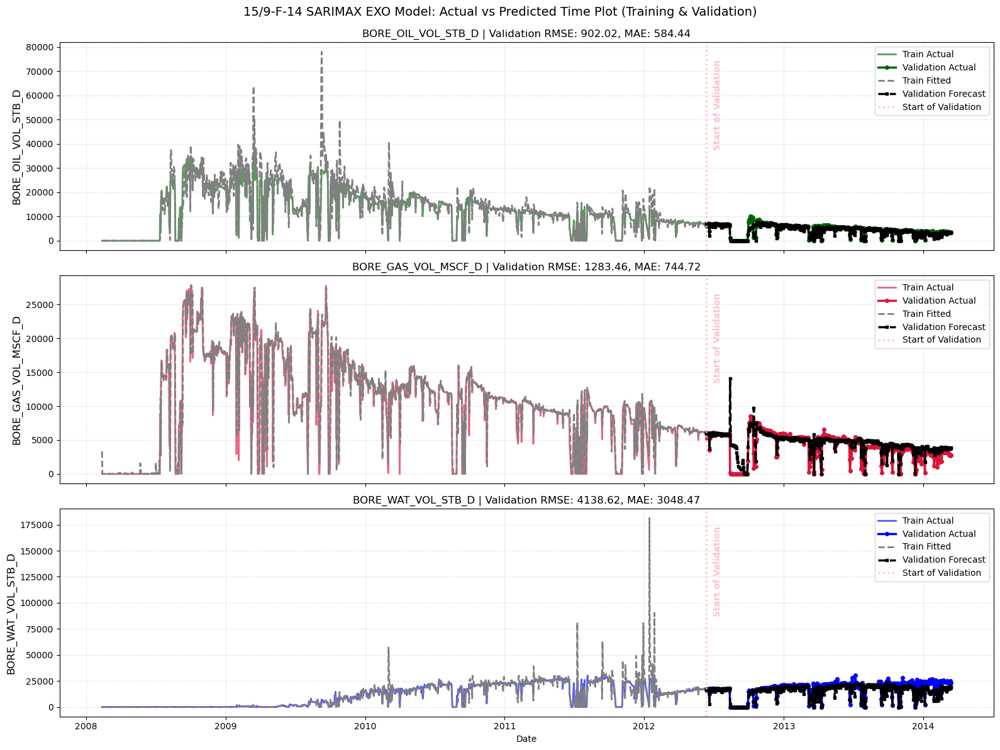

In [56]:
oil_model_key = "15/9-F-14_BORE_OIL_VOL_STB_D_sarima_model_log"
oil_order_key = "15/9-F-14_BORE_OIL_VOL_STB_D_sarima_model_log_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-14_BORE_GAS_VOL_MSCF_D_sarima_model"
gas_order_key = "15/9-F-14_BORE_GAS_VOL_MSCF_D_sarima_model_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-14_BORE_WAT_VOL_STB_D_sarima_model_log"
water_order_key = "15/9-F-14_BORE_WAT_VOL_STB_D_sarima_model_log_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]


# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

# 2. Generate the Oil Plot on the first axis (axes[0])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_OIL_VOL_STB_D",
    model=sarima_exo_models_dict[oil_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
    ax=axes[0],
    start_of_val_date=start_of_val_date
)

# 3. Generate the Gas Plot on the second axis (axes[1])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_GAS_VOL_MSCF_D",
    model=sarima_exo_models_dict[gas_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
    ax=axes[1],
    start_of_val_date=start_of_val_date
)

# 4. Generate the Water Plot on the third axis (axes[2])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_WAT_VOL_STB_D",
    model=sarima_exo_models_dict[water_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
    ax=axes[2],
    start_of_val_date=start_of_val_date
)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_4["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_4["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_Time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

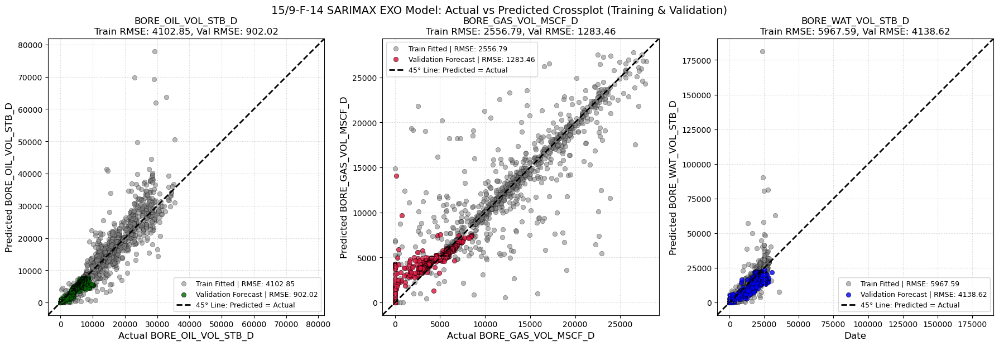

In [57]:
oil_model_key = "15/9-F-14_BORE_OIL_VOL_STB_D_sarima_model_log"
oil_order_key = "15/9-F-14_BORE_OIL_VOL_STB_D_sarima_model_log_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-14_BORE_GAS_VOL_MSCF_D_sarima_model"
gas_order_key = "15/9-F-14_BORE_GAS_VOL_MSCF_D_sarima_model_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-14_BORE_WAT_VOL_STB_D_sarima_model_log"
water_order_key = "15/9-F-14_BORE_WAT_VOL_STB_D_sarima_model_log_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]



fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Oil
oil_crossplot, oil_train_rmse, oil_train_mae, oil_val_rmse, oil_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                            train_data=train_data,
                                                                            val_data=val_data,
                                                                            phase_string="BORE_OIL_VOL_STB_D",
                                                                            model=sarima_exo_models_dict[oil_model_key],
                                                                            val_exog=val_exog,
                                                                            selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
                                                                            log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
                                                                            transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
                                                                            ax=axes[0])
# Gas
gas_crossplot, gas_train_rmse, gas_train_mae, gas_val_rmse, gas_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_GAS_VOL_MSCF_D",
                                                                        model=sarima_exo_models_dict[gas_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[1])
# water
water_crossplot, water_train_rmse, water_train_mae, water_val_rmse, water_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_WAT_VOL_STB_D",
                                                                        model=sarima_exo_models_dict[water_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[2])


# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_4["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Crossplot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_4["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_cross_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# DF 5

In [58]:
target_col=['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D','BORE_WAT_VOL_STB_D']
predictor_num_col=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'DP_CHOKE_SIZE_PSI',
      'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F',
       'AVG_DP_TUBING_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P','GOR_MSCF/STB', 'WCUT']
predictor_cat_cols=['FLOW_KIND', 'WELL_TYPE']

In [59]:
df_5.head()

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF/STB,WCUT,GOR_MSCF/STB_WAS_MISSING,WCUT_WAS_MISSING
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2014-01-12,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.181753,%,...,292.193845,293.154287,47.112332,0.0000,0.000000,0.0,0.837988,0.0,1,1
2014-01-13,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.197065,%,...,336.328908,337.363609,43.389752,0.0000,0.000000,0.0,0.837988,0.0,1,1
2014-01-14,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,1.125136,%,...,308.563704,309.614649,44.293874,0.0000,0.000000,0.0,0.837988,0.0,1,1
2014-01-15,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,0.0,2.610212,%,...,392.971034,462.315732,45.836258,0.0000,0.000000,0.0,0.837988,0.0,1,1
2014-01-16,NO 15/9-F-15 D,7289,15/9-F-15 D,3420717,VOLVE,369304,MÆRSK INSPIRER,24.0,8.660590,%,...,405.617020,810.338131,62.420158,2208.0378,1850.310175,0.0,0.837988,0.0,0,0


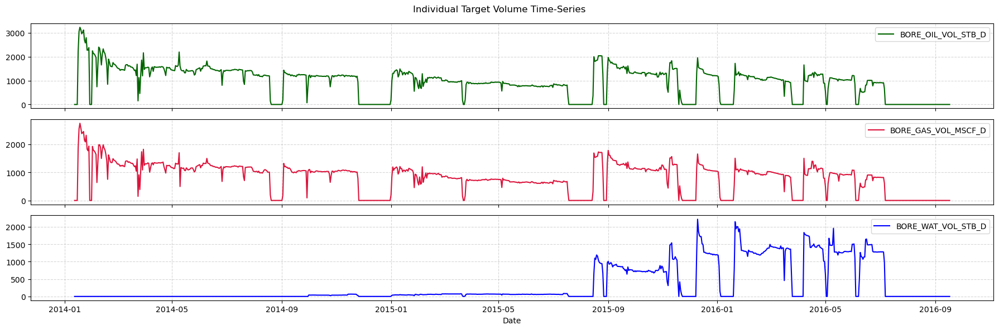

In [60]:
seperate_target_plot(df_5[target_col])

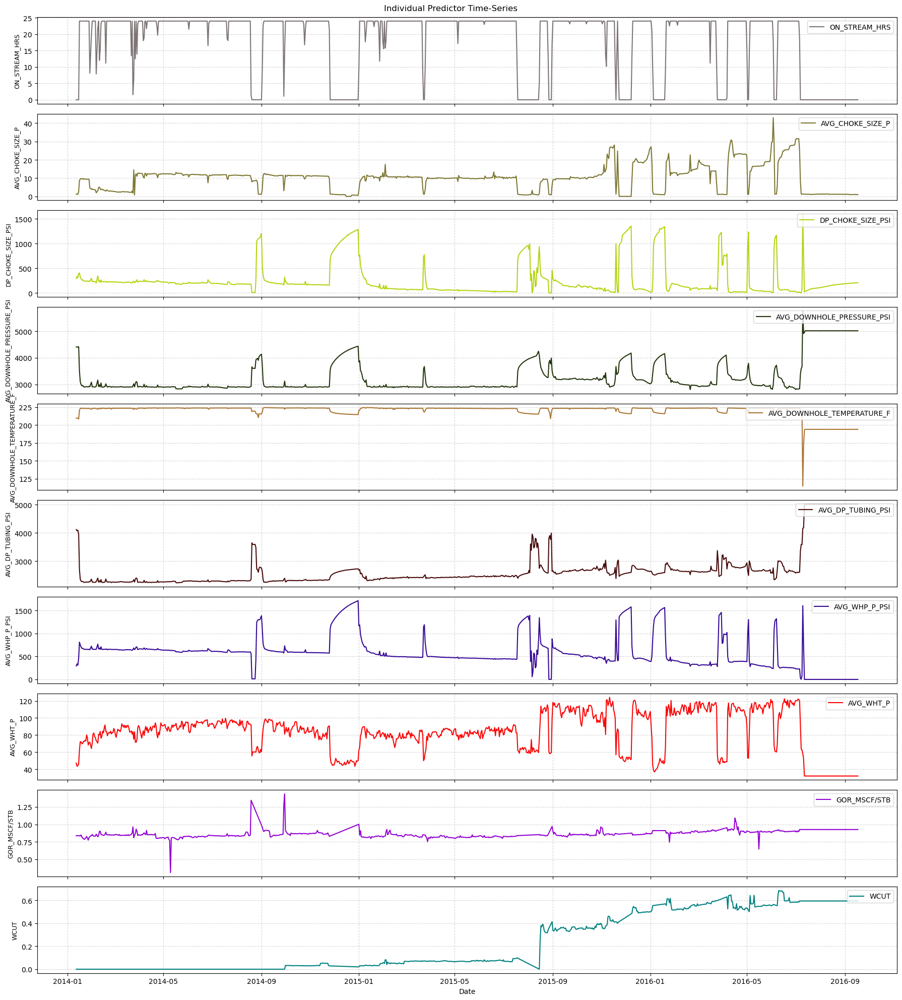

In [61]:
seperate_predictor_plot(df_5, features=predictor_num_col)

## ETS Decomposition

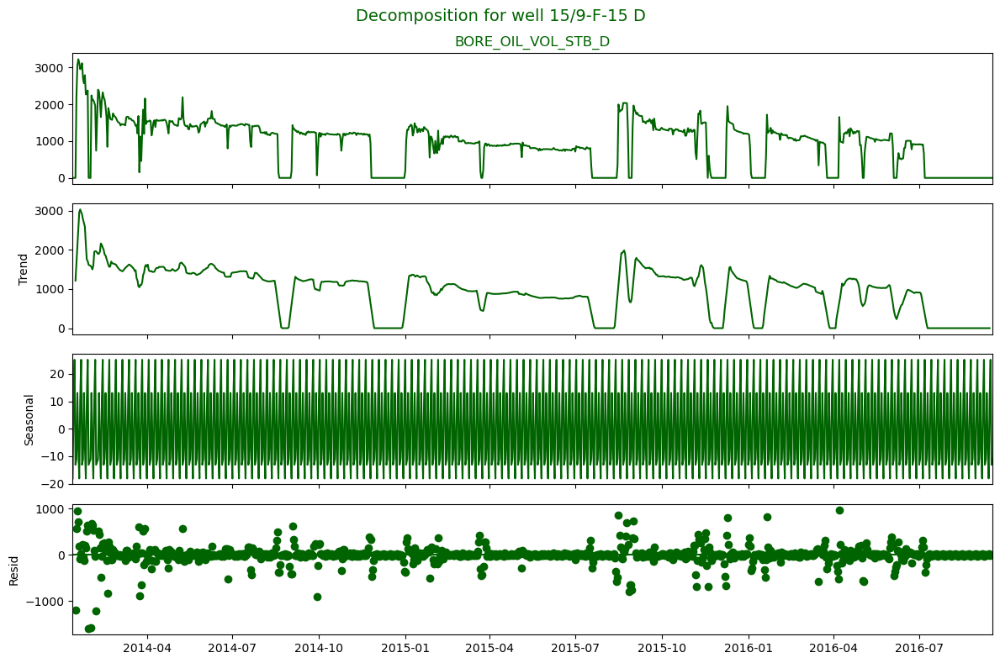

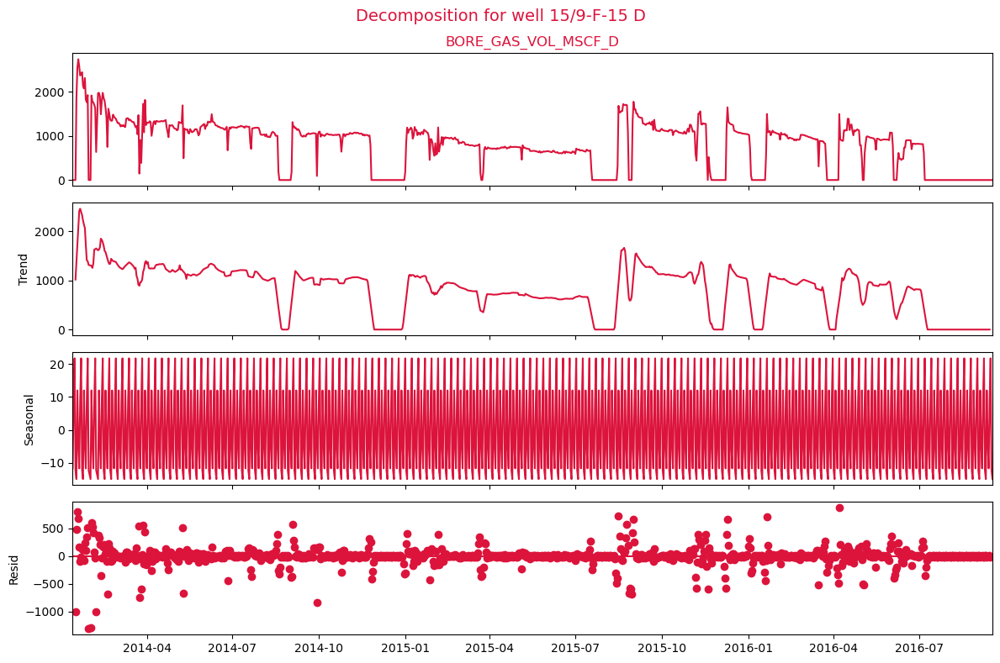

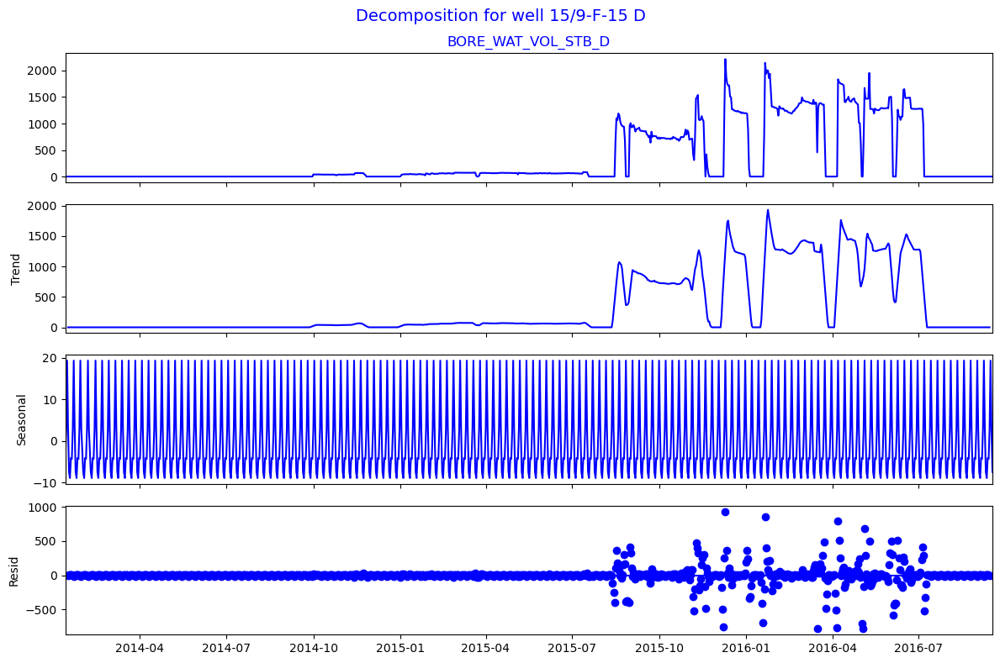

In [62]:
plot_decomposition(df_5, target_col,model="additive", period=7)

## ACF & PACF Plots and Monthly Plots

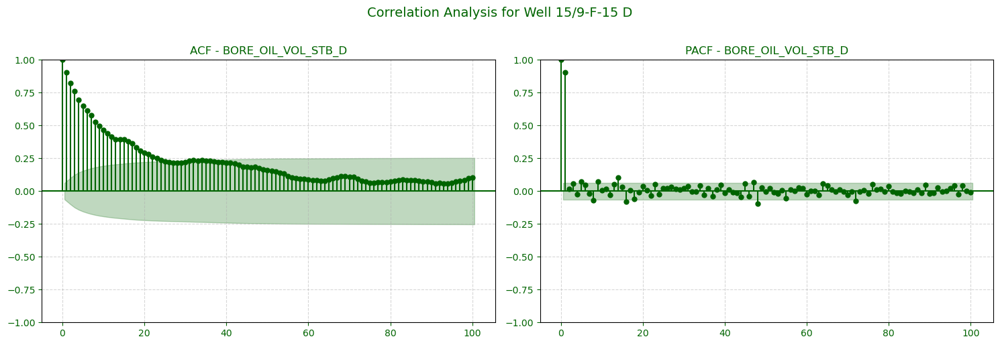

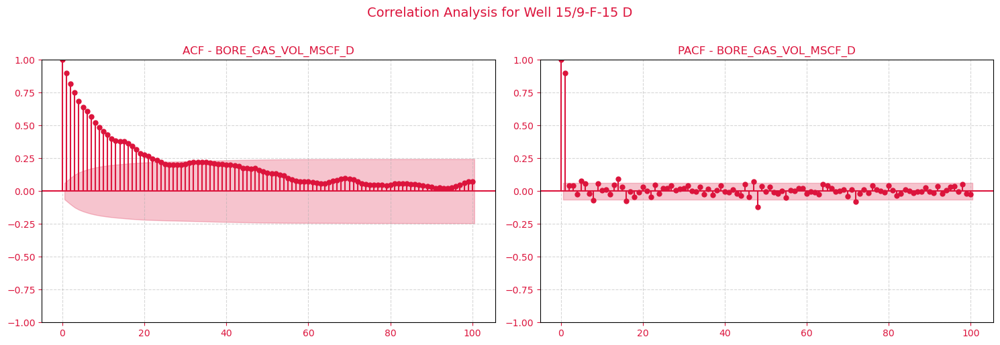

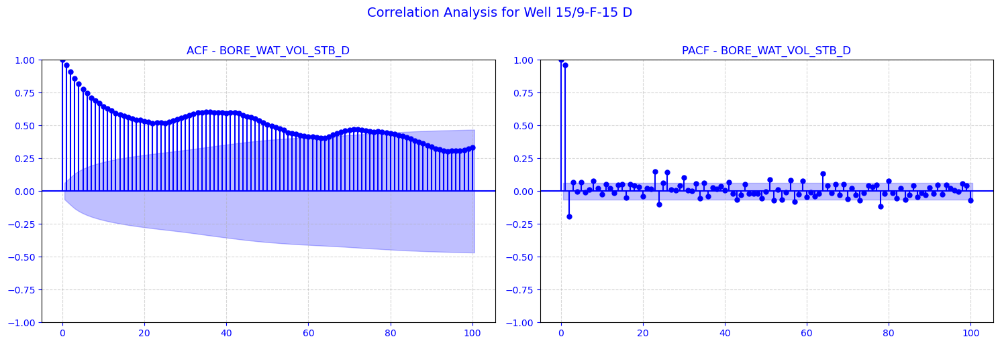

In [63]:
plot_acf_pacf_channels(df_5, target_col, lags=100)

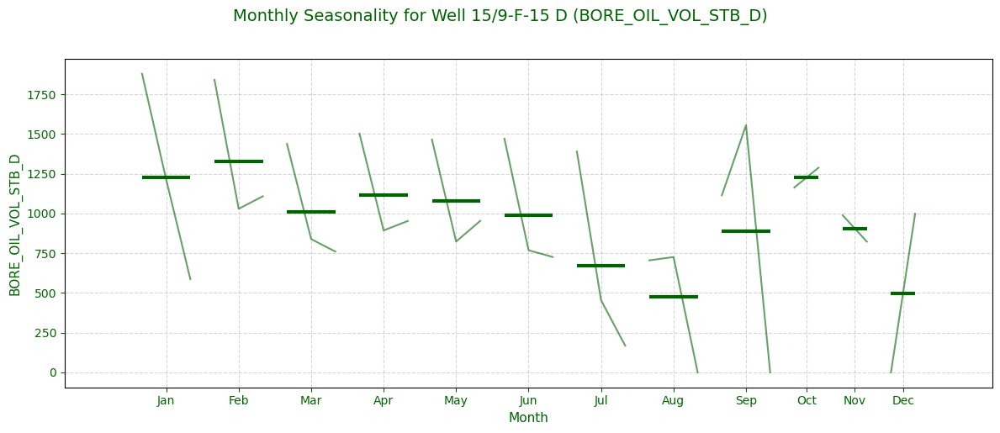

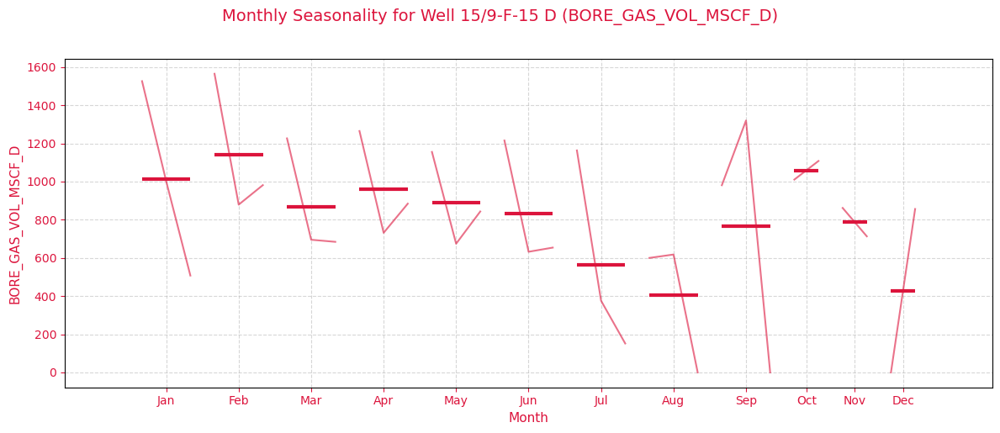

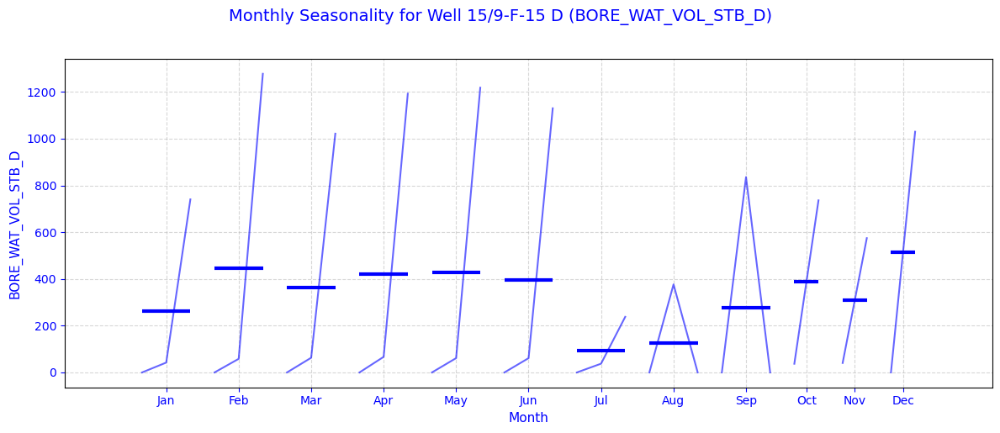

In [64]:
plot_monthly_seasonality(df_5, target_col)

## Find the best SARIMA model

In [65]:
train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df_5, 0.5,0.2,0.2)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_data=keep_data.index[0]
len(df_5)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)


train_exog = train_data[predictor_num_col]
val_exog = val_data[predictor_num_col]


sarima_exo_models_dict, sarima_exo_order_dict = find_best_sarima_model_for_all_phases_optuna_EXO(
    models_dict=sarima_exo_models_dict,
    order_dict=sarima_exo_order_dict,
    target_col=target_col,
    train_data=train_data,
    test_data=val_data,
    train_exog=train_exog,
    test_exog=val_exog,
    p_max=2,
    d_max=2,
    q_max=2,
    P_max=2,
    D_max=1,
    Q_max=1,
    seasonal_period=7,
    n_trials=100,
    maxiter=50,
    feature_selection=True,
    min_exog_features=1,
    max_exog_features=8,
)

[I 2026-06-25 18:03:34,945] A new study created in memory with name: no-name-aeaf0eaf-6d26-4fc4-8704-75fe400f5009



Running SARIMA/SARIMAX Optuna search for: 15/9-F-15 D | BORE_OIL_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:03:35,174] Trial 0 finished with value: 1276.4891065509564 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 1276.4891065509564.
[I 2026-06-25 18:03:35,212] Trial 1 finished with value: 4323.620407748719 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 1276.489106550956

[I 2026-06-25 18:04:29,333] A new study created in memory with name: no-name-1c384051-4428-4257-bb05-02ea19ae0352


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:04:29,571] Trial 0 finished with value: 956.020880617491 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 956.020880617491.
[I 2026-06-25 18:04:29,645] Trial 1 finished with value: 1026.7920651669315 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 956.020880617491.
[I

[I 2026-06-25 18:05:11,027] A new study created in memory with name: no-name-e616bb5a-86b3-4cd1-8bfa-d90c783984a1



15/9-F-15 D | BORE_OIL_VOL_STB_D
Normal RMSE: 274.7077070483164
Log RMSE:    338.1425727118301
Selected model: normal scale
Selected features: ['ON_STREAM_HRS', 'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_WHP_P_PSI', 'AVG_WHT_P', 'GOR_MSCF/STB']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-15 D | BORE_GAS_VOL_MSCF_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:05:11,272] Trial 0 finished with value: 1135.791911433508 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 1135.791911433508.
[I 2026-06-25 18:05:11,312] Trial 1 finished with value: 3538.576955312209 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 1135.791911433508.


[I 2026-06-25 18:05:31,748] A new study created in memory with name: no-name-2a6aef95-c19f-427b-928b-ae8dacd8fdd6


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:05:31,972] Trial 0 finished with value: 817.3682595699988 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 817.3682595699988.
[I 2026-06-25 18:05:32,104] Trial 1 finished with value: 875.780107174509 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 817.3682595699988.
[

[I 2026-06-25 18:06:11,920] A new study created in memory with name: no-name-c8dddc20-3ebe-43ac-9124-b269ec4e957f


[I 2026-06-25 18:06:11,782] Trial 99 finished with value: 290.88551583780367 and parameters: {'p': 0, 'd': 0, 'q': 1, 'P': 1, 'D': 0, 'Q': 1, 'trend': 'n', 'use_ON_STREAM_HRS': True, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': False, 'use_AVG_DOWNHOLE_TEMPERATURE_F': True, 'use_AVG_DP_TUBING_PSI': True, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': True, 'use_WCUT': False}. Best is trial 85 with value: 272.4895070977633.

15/9-F-15 D | BORE_GAS_VOL_MSCF_D
Normal RMSE: 263.96461996022697
Log RMSE:    272.4895070977633
Selected model: normal scale
Selected features: ['DP_CHOKE_SIZE_PSI', 'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_WHP_P_PSI', 'AVG_WHT_P', 'GOR_MSCF/STB']

Running SARIMA/SARIMAX Optuna search for: 15/9-F-15 D | BORE_WAT_VOL_STB_D


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:06:12,151] Trial 0 finished with value: 542.9385667947674 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 542.9385667947674.
[I 2026-06-25 18:06:12,227] Trial 1 finished with value: 510.3181792610363 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 1 with value: 510.3181792610363.


[I 2026-06-25 18:06:59,201] A new study created in memory with name: no-name-6a355be3-3159-4f79-957e-200d117cdb74


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-06-25 18:06:59,432] Trial 0 finished with value: 498.186397811341 and parameters: {'p': 1, 'd': 2, 'q': 2, 'P': 1, 'D': 0, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': False, 'use_DP_CHOKE_SIZE_PSI': False, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': True, 'use_AVG_WHT_P': True, 'use_GOR_MSCF/STB': False, 'use_WCUT': False}. Best is trial 0 with value: 498.186397811341.
[I 2026-06-25 18:06:59,567] Trial 1 finished with value: 37741.644959144025 and parameters: {'p': 0, 'd': 1, 'q': 1, 'P': 0, 'D': 1, 'Q': 0, 'trend': 'n', 'use_ON_STREAM_HRS': False, 'use_AVG_CHOKE_SIZE_P': True, 'use_DP_CHOKE_SIZE_PSI': True, 'use_AVG_DOWNHOLE_PRESSURE_PSI': True, 'use_AVG_DOWNHOLE_TEMPERATURE_F': False, 'use_AVG_DP_TUBING_PSI': False, 'use_AVG_WHP_P_PSI': False, 'use_AVG_WHT_P': False, 'use_GOR_MSCF/STB': True, 'use_WCUT': True}. Best is trial 0 with value: 498.186397811341.
[I

In [66]:
sarima_exo_models_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1874590>,
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1157890>,
 '15/9-F-1 C_BORE_WAT_VOL_STB_D_sarima_model': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eab8f51110>,
 '15/9-F-11_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac18589d0>,
 '15/9-F-11_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac1314950>,
 '15/9-F-11_BORE_WAT_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eac168ce90>,
 '15/9-F-12_BORE_OIL_VOL_STB_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x76eab8d846d0>,
 '15/9-F-12_BORE_GAS_VOL_MSCF_D_sarima_model_log': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWr

In [67]:
sarima_exo_order_dict

{'15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(305.8414160976389),
  'mse': np.float64(93538.9718006091),
  'mae': np.float64(173.97099224149366),
  'aic': np.float64(831.5836513283731),
  'bic': np.float64(874.2078893677455),
  'selected_features': ['ON_STREAM_HRS',
   'AVG_DOWNHOLE_TEMPERATURE_F',
   'AVG_DP_TUBING_PSI',
   'AVG_WHP_P_PSI',
   'AVG_WHT_P'],
  'model_key': '15/9-F-1 C_BORE_OIL_VOL_STB_D_sarima_model_log'},
 '15/9-F-1 C_BORE_GAS_VOL_MSCF_D_sarima_model_log_order': {'order': (2, 1, 0),
  'seasonal_order': (2, 0, 1, 7),
  'trend': 'n',
  'log_transform': True,
  'transform_type': 'log1p',
  'rmse': np.float64(266.78650008461653),
  'mse': np.float64(71175.03662739911),
  'mae': np.float64(152.5422615021109),
  'aic': np.float64(823.1306543499345),
  'bic': np.float64(865.7548923893069),
  'selected_features': ['ON_STR

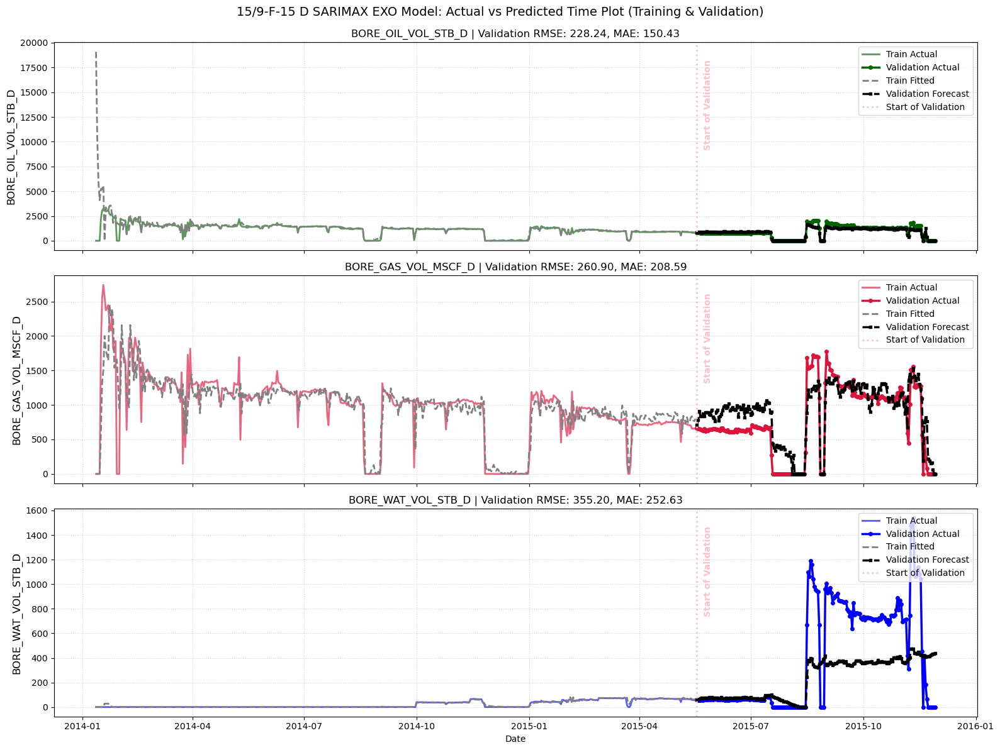

In [68]:
oil_model_key = "15/9-F-15 D_BORE_OIL_VOL_STB_D_sarima_model"
oil_order_key = "15/9-F-15 D_BORE_OIL_VOL_STB_D_sarima_model_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-15 D_BORE_GAS_VOL_MSCF_D_sarima_model"
gas_order_key = "15/9-F-15 D_BORE_GAS_VOL_MSCF_D_sarima_model_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-15 D_BORE_WAT_VOL_STB_D_sarima_model"
water_order_key = "15/9-F-15 D_BORE_WAT_VOL_STB_D_sarima_model_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]


# 'BORE_OIL_VOL_STB_D', BORE_GAS_VOL_MSCF_D, BORE_WAT_VOL_STB_D,

# 1. Create a single figure with 3 rows of subplots sharing the same X-axis (Dates)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(16, 12), sharex=True)

# 2. Generate the Oil Plot on the first axis (axes[0])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_OIL_VOL_STB_D",
    model=sarima_exo_models_dict[oil_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
    ax=axes[0],
    start_of_val_date=start_of_val_date
)

# 3. Generate the Gas Plot on the second axis (axes[1])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_GAS_VOL_MSCF_D",
    model=sarima_exo_models_dict[gas_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
    ax=axes[1],
    start_of_val_date=start_of_val_date
)

# 4. Generate the Water Plot on the third axis (axes[2])
plot_train_val_predictions_time_EXO(
    train_data=train_data,
    val_data=val_data,
    phase_string="BORE_WAT_VOL_STB_D",
    model=sarima_exo_models_dict[water_model_key],
    val_exog=val_exog,
    selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
    log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
    transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
    ax=axes[2],
    start_of_val_date=start_of_val_date
)

# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_5["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Time Plot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_5["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_Time_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

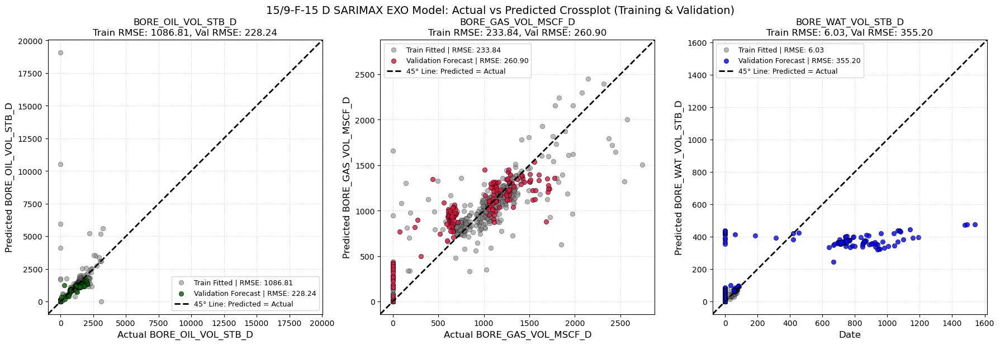

In [69]:
oil_model_key = "15/9-F-15 D_BORE_OIL_VOL_STB_D_sarima_model"
oil_order_key = "15/9-F-15 D_BORE_OIL_VOL_STB_D_sarima_model_order"
oil_selected_features = sarima_exo_order_dict[oil_order_key]["selected_features"]
oil_log_transform = sarima_exo_order_dict[oil_order_key]["log_transform"]

gas_model_key = "15/9-F-15 D_BORE_GAS_VOL_MSCF_D_sarima_model"
gas_order_key = "15/9-F-15 D_BORE_GAS_VOL_MSCF_D_sarima_model_order"
gas_selected_features = sarima_exo_order_dict[gas_order_key]["selected_features"]
gas_log_transform = sarima_exo_order_dict[gas_order_key]["log_transform"]

water_model_key = "15/9-F-15 D_BORE_WAT_VOL_STB_D_sarima_model"
water_order_key = "15/9-F-15 D_BORE_WAT_VOL_STB_D_sarima_model_order"
water_selected_features = sarima_exo_order_dict[water_order_key]["selected_features"]
water_log_transform = sarima_exo_order_dict[water_order_key]["log_transform"]



fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Oil
oil_crossplot, oil_train_rmse, oil_train_mae, oil_val_rmse, oil_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                            train_data=train_data,
                                                                            val_data=val_data,
                                                                            phase_string="BORE_OIL_VOL_STB_D",
                                                                            model=sarima_exo_models_dict[oil_model_key],
                                                                            val_exog=val_exog,
                                                                            selected_features=sarima_exo_order_dict[oil_order_key]["selected_features"],
                                                                            log_transform=sarima_exo_order_dict[oil_order_key]["log_transform"],
                                                                            transform_type=sarima_exo_order_dict[oil_order_key].get("transform_type", "log1p"),
                                                                            ax=axes[0])
# Gas
gas_crossplot, gas_train_rmse, gas_train_mae, gas_val_rmse, gas_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_GAS_VOL_MSCF_D",
                                                                        model=sarima_exo_models_dict[gas_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[gas_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[gas_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[gas_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[1])
# water
water_crossplot, water_train_rmse, water_train_mae, water_val_rmse, water_val_mae = plot_train_val_actual_vs_predicted_crossplot_EXO(
                                                                        train_data=train_data,
                                                                        val_data=val_data,
                                                                        phase_string="BORE_WAT_VOL_STB_D",
                                                                        model=sarima_exo_models_dict[water_model_key],
                                                                        val_exog=val_exog,
                                                                        selected_features=sarima_exo_order_dict[water_order_key]["selected_features"],
                                                                        log_transform=sarima_exo_order_dict[water_order_key]["log_transform"],
                                                                        transform_type=sarima_exo_order_dict[water_order_key].get("transform_type", "log1p"),
                                                                        ax=axes[2])


# 5. Format and save the combined master plot
axes[-1].set_xlabel('Date')  # Label the bottom X-axis
fig.suptitle(f'{df_5["NPD_WELL_BORE_NAME"].iloc[0]} SARIMAX EXO Model: Actual vs Predicted Crossplot (Training & Validation)', fontsize=14, y=0.99)
plt.tight_layout()

# Save the unified plot directly to disk
safe_well_name = str(df_5["NPD_WELL_BORE_NAME"].iloc[0]).replace('/', '-')
file_path = f'pictures/{safe_well_name}_sarima_EXO_prediction_cross_plot.png'
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()

# Export model out

In [70]:
import joblib

joblib.dump(sarima_exo_models_dict, "sarima_exo_models_dict.joblib")
joblib.dump(sarima_exo_order_dict, "sarima_exo_order_dict.joblib")

['sarima_exo_order_dict.joblib']

In [71]:
# load
#sarima_exo_models_dict = joblib.load("sarima_exo_models_dict.joblib")
#sarima_exo_order_dict = joblib.load("sarima_exo_order_dict.joblib")